In [42]:
import pandas as pd

In [2]:
%matplotlib notebook

Importing the CSV file into a dataframe and resetting the indices.

In [3]:
inc_div_full = pd.read_csv('https://raw.githubusercontent.com/leoRysing/DS-3000-final-project/main/composite/diversity_and_tuition_sorted.csv', index_col = 0)
inc_div_full.reset_index(drop=True, inplace=True)
inc_div_full

,name,total_enrollment,asian_enrollment,white_enrollment,black_enrollment,american_indian_alaska_native_enrollment,hispanic_enrollment,total_price,year,campus,...,net_cost_over_110,state,state_code,type,degree_length,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total
0,Aaniiih Nakoda College,291.0,0.0,33.0,0.0,256.0,2.0,17030,2017,Off Campus,...,0.000000,Montana,MT,Public,2 Year,0.0,2380,2380,2380,2380
1,Aaniiih Nakoda College,291.0,0.0,33.0,0.0,256.0,2.0,17030,2018,Off Campus,...,0.000000,Montana,MT,Public,2 Year,0.0,2380,2380,2380,2380
2,Abilene Christian University,4427.0,46.0,2959.0,387.0,18.0,582.0,48300,2017,On Campus,...,31205.917790,Texas,TX,Private,4 Year,10350.0,34850,45200,34850,45200
3,Abilene Christian University,4427.0,46.0,2959.0,387.0,18.0,582.0,45980,2016,On Campus,...,29707.000000,Texas,TX,Private,4 Year,10350.0,34850,45200,34850,45200
4,Abilene Christian University,4427.0,46.0,2959.0,387.0,18.0,582.0,48300,2017,Off Campus,...,31205.917790,Texas,TX,Private,4 Year,10350.0,34850,45200,34850,45200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,Yuba College,6640.0,744.0,2846.0,262.0,79.0,2032.0,20510,2017,Off Campus,...,3209.760020,California,CA,Public,2 Year,0.0,1400,1400,8420,8420
9131,Yuba College,6640.0,744.0,2846.0,262.0,79.0,2032.0,21068,2018,Off Campus,...,3297.085525,California,CA,Public,2 Year,0.0,1400,1400,8420,8420
9132,Zane State College,4009.0,10.0,3170.0,110.0,16.0,14.0,14764,2018,Off Campus,...,10735.133290,Ohio,OH,Public,2 Year,0.0,5070,5070,9930,9930
9133,Zane State College,4009.0,10.0,3170.0,110.0,16.0,14.0,14254,2017,Off Campus,...,10364.304390,Ohio,OH,Public,2 Year,0.0,5070,5070,9930,9930


Dropping unnecessary columns and moving what will become our target variables to the end of the dataframe.

In [4]:
inc_div = inc_div_full.drop(['name', 'state'], axis=1)
inc_div_enrollment = inc_div.iloc[0:,1:6]
inc_div.drop(['asian_enrollment', 'white_enrollment', 'black_enrollment', 
              'american_indian_alaska_native_enrollment', 'hispanic_enrollment'], axis=1, inplace=True)
inc_div = pd.concat([inc_div, inc_div_enrollment], axis=1)
inc_div

,total_enrollment,total_price,year,campus,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,asian_enrollment,white_enrollment,black_enrollment,american_indian_alaska_native_enrollment,hispanic_enrollment
0,291.0,17030,2017,Off Campus,8541.000000,7371.000000,0.000000,10492.000000,0.000000,MT,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
1,291.0,17030,2018,Off Campus,8541.000000,7371.000000,0.000000,10492.000000,0.000000,MT,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
2,4427.0,48300,2017,On Campus,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,TX,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
3,4427.0,45980,2016,On Campus,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,TX,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
4,4427.0,48300,2017,Off Campus,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,TX,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,Off Campus,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,CA,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9131,6640.0,21068,2018,Off Campus,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,CA,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9132,4009.0,14764,2018,Off Campus,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,OH,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0
9133,4009.0,14254,2017,Off Campus,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,OH,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0


Changing state abbreviations to numerical values 0-49.

In [5]:
state_numbers = {}
num = 0

for state in inc_div.state_code:
    if state not in state_numbers.keys():
        state_numbers[state] = num
        num = num + 1    
        
inc_div_codedstate = inc_div.replace({"state_code": state_numbers})  
inc_div_codedstate

,total_enrollment,total_price,year,campus,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,asian_enrollment,white_enrollment,black_enrollment,american_indian_alaska_native_enrollment,hispanic_enrollment
0,291.0,17030,2017,Off Campus,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
1,291.0,17030,2018,Off Campus,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
2,4427.0,48300,2017,On Campus,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
3,4427.0,45980,2016,On Campus,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,1,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
4,4427.0,48300,2017,Off Campus,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,Off Campus,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,4,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9131,6640.0,21068,2018,Off Campus,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,4,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9132,4009.0,14764,2018,Off Campus,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,17,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0
9133,4009.0,14254,2017,Off Campus,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,17,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0


One-hot encoding the type column of the dataframe. This will create three new columns: public, private, and for-profit. Each school will have a 1 in one of the columns to represent which category it falls into, and will have a value of 0 for the other two columns. This gives us a way to represent this binary data (yes/no for each type of school) in a numerical way.

In [6]:
from sklearn.preprocessing import OneHotEncoder

pubpriv = inc_div_codedstate.iloc[:, 10:11]

encoder = OneHotEncoder(sparse=False)
encoded_df = encoder.fit_transform(pubpriv)

pubpriv_df = pd.DataFrame(encoded_df, columns=encoder.get_feature_names())
pubpriv_df

,x0_For Profit,x0_Private,x0_Public
0,0.0,0.0,1.0
1,0.0,0.0,1.0
2,0.0,1.0,0.0
3,0.0,1.0,0.0
4,0.0,1.0,0.0
...,...,...,...
9130,0.0,0.0,1.0
9131,0.0,0.0,1.0
9132,0.0,0.0,1.0
9133,0.0,0.0,1.0


One-hot encoding the campus column of the dataframe. This will create two new columns: off-campus (no housing) and on-campus (has housing). Each school will have a 1 in one of the columns to represent which category it falls into, and will have a value of 0 for the other column. This gives us a way to represent this binary data (yes/no for on/off campus) in a numerical way.

In [7]:
campus = inc_div_codedstate.iloc[:, 3:4]

encoder = OneHotEncoder(sparse=False)
encoded_df = encoder.fit_transform(campus)

campus_df = pd.DataFrame(encoded_df, columns=encoder.get_feature_names())
campus_df

,x0_Off Campus,x0_On Campus
0,1.0,0.0
1,1.0,0.0
2,0.0,1.0
3,0.0,1.0
4,1.0,0.0
...,...,...
9130,1.0,0.0
9131,1.0,0.0
9132,1.0,0.0
9133,1.0,0.0


One-hot encoding the degree length column of the dataframe. This will create two new columns: 2-year (associate's degree is highest degree offered) and 4-year (bachelor's degree is offered). Each school will have a 1 in one of the columns to represent which category it falls into, and will have a value of 0 for the other column. This gives us a way to represent this binary data (yes/no for highest degree offered) in a numerical way.

In [8]:
deglen = inc_div_codedstate.iloc[:, 11:12]

encoder = OneHotEncoder(sparse=False)
encoded_df = encoder.fit_transform(deglen)

deglen_df = pd.DataFrame(encoded_df, columns=encoder.get_feature_names())
deglen_df

,x0_2 Year,x0_4 Year
0,1.0,0.0
1,1.0,0.0
2,0.0,1.0
3,0.0,1.0
4,0.0,1.0
...,...,...
9130,1.0,0.0
9131,1.0,0.0
9132,1.0,0.0
9133,1.0,0.0


Merging the original dataframe and the newly-encoded dataframes into one dataframe.

In [9]:
inc_div_precoded = pd.concat([inc_div_codedstate.iloc[:,0:3], pubpriv_df, 
                             inc_div_codedstate.iloc[:,4:10], campus_df, deglen_df,
                             inc_div_codedstate.iloc[:,12:22]], axis=1)

inc_div_precoded.rename(columns={'x0_For Profit':'for_profit', 'x0_Private':'private', 
                              'x0_Public':'public', 'x0_Off Campus':'off_campus', 
                              'x0_On Campus':'on_campus', 'x0_2 Year':'two_year', 
                              'x0_4 Year':'four_year'}, inplace = True)

inc_div_precoded.to_csv("inc_div_coded.csv")

inc_div_precoded

,total_enrollment,total_price,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,...,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,asian_enrollment,white_enrollment,black_enrollment,american_indian_alaska_native_enrollment,hispanic_enrollment
0,291.0,17030,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
1,291.0,17030,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
2,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
3,4427.0,45980,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
4,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9131,6640.0,21068,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9132,4009.0,14764,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0
9133,4009.0,14254,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0


In [10]:
total_price = inc_div_precoded.total_price
total_enrollment = inc_div_precoded.total_enrollment
inc_div_precoded_dropped = inc_div_precoded.drop(['total_enrollment', 'total_price'], axis=1)
inc_div_coded = pd.concat([inc_div_precoded.iloc[:,2:21], total_price, total_enrollment, inc_div_precoded.iloc[:,21:26]], axis=1)
inc_div_coded

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,asian_enrollment,white_enrollment,black_enrollment,american_indian_alaska_native_enrollment,hispanic_enrollment
0,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,2380,2380,2380,17030,291.0,0.0,33.0,0.0,256.0,2.0
1,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,2380,2380,2380,17030,291.0,0.0,33.0,0.0,256.0,2.0
2,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,45200,34850,45200,48300,4427.0,46.0,2959.0,387.0,18.0,582.0
3,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,1,...,45200,34850,45200,45980,4427.0,46.0,2959.0,387.0,18.0,582.0
4,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,45200,34850,45200,48300,4427.0,46.0,2959.0,387.0,18.0,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,4,...,1400,8420,8420,20510,6640.0,744.0,2846.0,262.0,79.0,2032.0
9131,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,4,...,1400,8420,8420,21068,6640.0,744.0,2846.0,262.0,79.0,2032.0
9132,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,17,...,5070,9930,9930,14764,4009.0,10.0,3170.0,110.0,16.0,14.0
9133,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,17,...,5070,9930,9930,14254,4009.0,10.0,3170.0,110.0,16.0,14.0


In [11]:
from sklearn.preprocessing import StandardScaler

net_cost = inc_div_coded.iloc[:,4:9]
scaler = StandardScaler()
scaler.fit(net_cost)
scaled_net_cost = scaler.transform(net_cost)
snc_df = pd.DataFrame(scaled_net_cost)
snc_df.rename(columns={0:'net_cost_0_to_30', 1:'net_cost_30_to_48', 
                              2:'net_cost_48_to_75', 3:'net_cost_75_to_110', 
                              4:'net_cost_over_110'}, inplace = True)
snc_df

,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110
0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428
1,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428
2,1.183339,1.285896,1.111418,0.977481,0.842820
3,1.039239,1.135485,0.958457,0.829002,0.718642
4,1.183339,1.285896,1.111418,0.977481,0.842820
...,...,...,...,...,...
9130,-1.177888,-1.224394,-1.140371,-2.113704,-1.476516
9131,-1.160509,-1.207496,-1.114995,-2.113704,-1.469281
9132,-1.032803,-1.020190,-0.887653,-1.054946,-0.853078
9133,-1.059880,-1.048699,-0.928602,-1.091520,-0.883799


In [12]:
cost = inc_div_coded.iloc[:, 14:20]
cost
scaler = StandardScaler()
scaler.fit(cost)
scaled_cost = scaler.transform(cost)
sc_df = pd.DataFrame(scaled_cost)
sc_df.rename(columns={0:'room_and_board', 1:'in_state_tuition', 
                              2:'in_state_total', 3:'out_of_state_tuition', 
                              4:'out_of_state_total', 5:'total_price'}, inplace = True)
sc_df

,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price
0,-1.625550,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779
1,-1.625550,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779
2,0.458436,0.958661,0.887088,0.843117,0.781185,0.905391
3,0.458436,0.958661,0.887088,0.843117,0.781185,0.764932
4,0.458436,0.958661,0.887088,0.843117,0.781185,0.905391
...,...,...,...,...,...,...
9130,-1.625550,-1.150764,-1.335876,-1.057397,-1.270832,-0.777090
9131,-1.625550,-1.150764,-1.335876,-1.057397,-1.270832,-0.743308
9132,-1.625550,-0.919326,-1.149614,-0.948817,-1.186587,-1.124969
9133,-1.625550,-0.919326,-1.149614,-0.948817,-1.186587,-1.155846


In [13]:
inc_div_scaled = pd.concat([inc_div_coded.iloc[:,0:4], snc_df, inc_div_coded.iloc[:,9:14], sc_df, 
                            inc_div_coded.iloc[:,20:26]], axis=1)
inc_div_scaled

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,asian_enrollment,white_enrollment,black_enrollment,american_indian_alaska_native_enrollment,hispanic_enrollment
0,2017,0.0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,0,...,-1.286139,-1.491718,-1.607814,-0.987779,291.0,0.0,33.0,0.0,256.0,2.0
1,2018,0.0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,0,...,-1.286139,-1.491718,-1.607814,-0.987779,291.0,0.0,33.0,0.0,256.0,2.0
2,2017,0.0,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,1,...,0.887088,0.843117,0.781185,0.905391,4427.0,46.0,2959.0,387.0,18.0,582.0
3,2016,0.0,1.0,0.0,1.039239,1.135485,0.958457,0.829002,0.718642,1,...,0.887088,0.843117,0.781185,0.764932,4427.0,46.0,2959.0,387.0,18.0,582.0
4,2017,0.0,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,1,...,0.887088,0.843117,0.781185,0.905391,4427.0,46.0,2959.0,387.0,18.0,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,-1.177888,-1.224394,-1.140371,-2.113704,-1.476516,4,...,-1.335876,-1.057397,-1.270832,-0.777090,6640.0,744.0,2846.0,262.0,79.0,2032.0
9131,2018,0.0,0.0,1.0,-1.160509,-1.207496,-1.114995,-2.113704,-1.469281,4,...,-1.335876,-1.057397,-1.270832,-0.743308,6640.0,744.0,2846.0,262.0,79.0,2032.0
9132,2018,0.0,0.0,1.0,-1.032803,-1.020190,-0.887653,-1.054946,-0.853078,17,...,-1.149614,-0.948817,-1.186587,-1.124969,4009.0,10.0,3170.0,110.0,16.0,14.0
9133,2017,0.0,0.0,1.0,-1.059880,-1.048699,-0.928602,-1.091520,-0.883799,17,...,-1.149614,-0.948817,-1.186587,-1.155846,4009.0,10.0,3170.0,110.0,16.0,14.0


Setting up the dataframe for target variable #1.

In [43]:
inc_div_target1 = inc_div_coded.drop(['white_enrollment', 'black_enrollment', 'american_indian_alaska_native_enrollment', 
                                'hispanic_enrollment'], axis=1)
inc_div_target1.rename(columns={'asian_enrollment':'target1'}, inplace = True)
inc_div_target1

,total_enrollment,total_price,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,...,off_campus,on_campus,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,target1
0,291.0,17030,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,0.0
1,291.0,17030,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,0.0
2,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,46.0
3,4427.0,45980,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,46.0
4,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,1.0,0.0,0.0,1.0,10350.0,34850,45200,34850,45200,46.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,744.0
9131,6640.0,21068,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,744.0
9132,4009.0,14764,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,10.0
9133,4009.0,14254,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,10.0


In [85]:
target1_vis_df = inc_div_target1[["total_price", "total_enrollment", "private", "public",
                                      "net_cost_0_to_30", "net_cost_30_to_48", "net_cost_48_to_75", "target1"]]
target1_vis_df.insert(6, "proportion",
    list(target1_vis_df["target1"] / target1_vis_df["total_enrollment"]), True)
target1_vis_df

,total_price,total_enrollment,private,public,net_cost_0_to_30,net_cost_30_to_48,proportion,net_cost_48_to_75,target1
0,17030,291.0,0.0,1.0,8541.000000,7371.000000,0.000000,0.000000,0.0
1,17030,291.0,0.0,1.0,8541.000000,7371.000000,0.000000,0.000000,0.0
2,48300,4427.0,1.0,0.0,23184.630270,24835.948240,0.010391,26151.120050,46.0
3,45980,4427.0,1.0,0.0,22071.000000,23643.000000,0.010391,24895.000000,46.0
4,48300,4427.0,1.0,0.0,23184.630270,24835.948240,0.010391,26151.120050,46.0
...,...,...,...,...,...,...,...,...,...
9130,20510,6640.0,0.0,1.0,4936.642328,4926.170028,0.112048,7659.440388,744.0
9131,21068,6640.0,0.0,1.0,5070.949809,5060.192596,0.112048,7867.824968,744.0
9132,14764,4009.0,0.0,1.0,6057.890797,6545.768499,0.002494,9734.756022,10.0
9133,14254,4009.0,0.0,1.0,5848.630142,6319.654849,0.002494,9398.483632,10.0


In [15]:
features1 = inc_div_target1.drop(['target1'], axis=1)
target1 = inc_div_target1.target1
target1.describe()

count     9135.000000
mean       290.818719
std        779.314179
min          0.000000
25%         15.000000
50%         54.000000
75%        200.000000
max      10381.000000
Name: target1, dtype: float64

In [16]:
inc_div_scaled_target1 = inc_div_scaled.drop(['white_enrollment', 'black_enrollment', 'american_indian_alaska_native_enrollment', 
                                'hispanic_enrollment'], axis=1)
inc_div_scaled_target1.rename(columns={'asian_enrollment':'target1'}, inplace = True)
inc_div_scaled_target1

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,target1
0,2017,0.0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,0,...,1.0,0.0,-1.625550,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779,291.0,0.0
1,2018,0.0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,0,...,1.0,0.0,-1.625550,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779,291.0,0.0
2,2017,0.0,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.905391,4427.0,46.0
3,2016,0.0,1.0,0.0,1.039239,1.135485,0.958457,0.829002,0.718642,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.764932,4427.0,46.0
4,2017,0.0,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.905391,4427.0,46.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,-1.177888,-1.224394,-1.140371,-2.113704,-1.476516,4,...,1.0,0.0,-1.625550,-1.150764,-1.335876,-1.057397,-1.270832,-0.777090,6640.0,744.0
9131,2018,0.0,0.0,1.0,-1.160509,-1.207496,-1.114995,-2.113704,-1.469281,4,...,1.0,0.0,-1.625550,-1.150764,-1.335876,-1.057397,-1.270832,-0.743308,6640.0,744.0
9132,2018,0.0,0.0,1.0,-1.032803,-1.020190,-0.887653,-1.054946,-0.853078,17,...,1.0,0.0,-1.625550,-0.919326,-1.149614,-0.948817,-1.186587,-1.124969,4009.0,10.0
9133,2017,0.0,0.0,1.0,-1.059880,-1.048699,-0.928602,-1.091520,-0.883799,17,...,1.0,0.0,-1.625550,-0.919326,-1.149614,-0.948817,-1.186587,-1.155846,4009.0,10.0


Setting up the dataframe for target variable #2.

In [17]:
inc_div_target2 = inc_div_coded.drop(['asian_enrollment', 'black_enrollment', 'american_indian_alaska_native_enrollment', 
                                'hispanic_enrollment'], axis=1)
inc_div_target2.rename(columns={'white_enrollment':'target2'}, inplace = True)
inc_div_target2

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,target2
0,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0,33.0
1,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0,33.0
2,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0,2959.0
3,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,45980,4427.0,2959.0
4,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0,2959.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,4,...,1.0,0.0,0.0,1400,1400,8420,8420,20510,6640.0,2846.0
9131,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,4,...,1.0,0.0,0.0,1400,1400,8420,8420,21068,6640.0,2846.0
9132,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,17,...,1.0,0.0,0.0,5070,5070,9930,9930,14764,4009.0,3170.0
9133,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,17,...,1.0,0.0,0.0,5070,5070,9930,9930,14254,4009.0,3170.0


In [86]:
target2_vis_df = inc_div_target2[["total_price", "total_enrollment", "private", "public",
                                      "net_cost_0_to_30", "net_cost_30_to_48", "net_cost_48_to_75", "target2"]]
target2_vis_df.insert(6, "proportion",
    list(target2_vis_df["target2"] / target2_vis_df["total_enrollment"]), True)
target2_vis_df

,total_price,total_enrollment,private,public,net_cost_0_to_30,net_cost_30_to_48,proportion,net_cost_48_to_75,target2
0,17030,291.0,0.0,1.0,8541.000000,7371.000000,0.113402,0.000000,33.0
1,17030,291.0,0.0,1.0,8541.000000,7371.000000,0.113402,0.000000,33.0
2,48300,4427.0,1.0,0.0,23184.630270,24835.948240,0.668398,26151.120050,2959.0
3,45980,4427.0,1.0,0.0,22071.000000,23643.000000,0.668398,24895.000000,2959.0
4,48300,4427.0,1.0,0.0,23184.630270,24835.948240,0.668398,26151.120050,2959.0
...,...,...,...,...,...,...,...,...,...
9130,20510,6640.0,0.0,1.0,4936.642328,4926.170028,0.428614,7659.440388,2846.0
9131,21068,6640.0,0.0,1.0,5070.949809,5060.192596,0.428614,7867.824968,2846.0
9132,14764,4009.0,0.0,1.0,6057.890797,6545.768499,0.790721,9734.756022,3170.0
9133,14254,4009.0,0.0,1.0,5848.630142,6319.654849,0.790721,9398.483632,3170.0


In [18]:
features2 = inc_div_target2.drop(['target2'], axis=1)
target2 = inc_div_target2.target2
target2.describe()

count     9135.000000
mean      3399.711330
std       4369.043621
min          0.000000
25%        813.000000
50%       1854.000000
75%       4145.000000
max      41898.000000
Name: target2, dtype: float64

In [19]:
inc_div_scaled_target2 = inc_div_scaled.drop(['asian_enrollment', 'black_enrollment', 'american_indian_alaska_native_enrollment', 
                                'hispanic_enrollment'], axis=1)
inc_div_target2.rename(columns={'white_enrollment':'target2'}, inplace = True)
inc_div_target2

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,target2
0,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0,33.0
1,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0,33.0
2,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0,2959.0
3,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,45980,4427.0,2959.0
4,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0,2959.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,4,...,1.0,0.0,0.0,1400,1400,8420,8420,20510,6640.0,2846.0
9131,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,4,...,1.0,0.0,0.0,1400,1400,8420,8420,21068,6640.0,2846.0
9132,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,17,...,1.0,0.0,0.0,5070,5070,9930,9930,14764,4009.0,3170.0
9133,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,17,...,1.0,0.0,0.0,5070,5070,9930,9930,14254,4009.0,3170.0


Setting up the dataframe for target variable #3.

In [20]:
inc_div_target3 = inc_div_coded.drop(['white_enrollment', 'asian_enrollment', 'american_indian_alaska_native_enrollment', 
                                'hispanic_enrollment'], axis=1)
inc_div_target3.rename(columns={'black_enrollment':'target3'}, inplace = True)
inc_div_target3

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,target3
0,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0,0.0
1,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0,0.0
2,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0,387.0
3,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,45980,4427.0,387.0
4,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0,387.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,4,...,1.0,0.0,0.0,1400,1400,8420,8420,20510,6640.0,262.0
9131,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,4,...,1.0,0.0,0.0,1400,1400,8420,8420,21068,6640.0,262.0
9132,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,17,...,1.0,0.0,0.0,5070,5070,9930,9930,14764,4009.0,110.0
9133,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,17,...,1.0,0.0,0.0,5070,5070,9930,9930,14254,4009.0,110.0


In [87]:
target3_vis_df = inc_div_target3[["total_price", "total_enrollment", "private", "public",
                                      "net_cost_0_to_30", "net_cost_30_to_48", "net_cost_48_to_75", "target3"]]
target3_vis_df.insert(6, "proportion",
    list(target3_vis_df["target3"] / target3_vis_df["total_enrollment"]), True)
target3_vis_df

,total_price,total_enrollment,private,public,net_cost_0_to_30,net_cost_30_to_48,proportion,net_cost_48_to_75,target3
0,17030,291.0,0.0,1.0,8541.000000,7371.000000,0.000000,0.000000,0.0
1,17030,291.0,0.0,1.0,8541.000000,7371.000000,0.000000,0.000000,0.0
2,48300,4427.0,1.0,0.0,23184.630270,24835.948240,0.087418,26151.120050,387.0
3,45980,4427.0,1.0,0.0,22071.000000,23643.000000,0.087418,24895.000000,387.0
4,48300,4427.0,1.0,0.0,23184.630270,24835.948240,0.087418,26151.120050,387.0
...,...,...,...,...,...,...,...,...,...
9130,20510,6640.0,0.0,1.0,4936.642328,4926.170028,0.039458,7659.440388,262.0
9131,21068,6640.0,0.0,1.0,5070.949809,5060.192596,0.039458,7867.824968,262.0
9132,14764,4009.0,0.0,1.0,6057.890797,6545.768499,0.027438,9734.756022,110.0
9133,14254,4009.0,0.0,1.0,5848.630142,6319.654849,0.027438,9398.483632,110.0


In [21]:
features3 = inc_div_target3.drop(['target3'], axis=1)
target3 = inc_div_target3.target3
target3.describe()

count     9135.000000
mean       742.179967
std       1391.991834
min          0.000000
25%         81.000000
50%        234.000000
75%        778.000000
max      18914.000000
Name: target3, dtype: float64

In [22]:
inc_div_scaled_target3 = inc_div_scaled.drop(['white_enrollment', 'asian_enrollment', 'american_indian_alaska_native_enrollment', 
                                'hispanic_enrollment'], axis=1)
inc_div_scaled_target3.rename(columns={'black_enrollment':'target3'}, inplace = True)
inc_div_scaled_target3

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,target3
0,2017,0.0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,0,...,1.0,0.0,-1.625550,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779,291.0,0.0
1,2018,0.0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,0,...,1.0,0.0,-1.625550,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779,291.0,0.0
2,2017,0.0,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.905391,4427.0,387.0
3,2016,0.0,1.0,0.0,1.039239,1.135485,0.958457,0.829002,0.718642,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.764932,4427.0,387.0
4,2017,0.0,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.905391,4427.0,387.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,-1.177888,-1.224394,-1.140371,-2.113704,-1.476516,4,...,1.0,0.0,-1.625550,-1.150764,-1.335876,-1.057397,-1.270832,-0.777090,6640.0,262.0
9131,2018,0.0,0.0,1.0,-1.160509,-1.207496,-1.114995,-2.113704,-1.469281,4,...,1.0,0.0,-1.625550,-1.150764,-1.335876,-1.057397,-1.270832,-0.743308,6640.0,262.0
9132,2018,0.0,0.0,1.0,-1.032803,-1.020190,-0.887653,-1.054946,-0.853078,17,...,1.0,0.0,-1.625550,-0.919326,-1.149614,-0.948817,-1.186587,-1.124969,4009.0,110.0
9133,2017,0.0,0.0,1.0,-1.059880,-1.048699,-0.928602,-1.091520,-0.883799,17,...,1.0,0.0,-1.625550,-0.919326,-1.149614,-0.948817,-1.186587,-1.155846,4009.0,110.0


Setting up the dataframe for target variable #4.

In [23]:
inc_div_target4 = inc_div_coded.drop(['black_enrollment', 'asian_enrollment', 'white_enrollment', 'hispanic_enrollment'], 
                               axis=1)
inc_div_target4.rename(columns={'american_indian_alaska_native_enrollment':'target4'}, inplace = True)
inc_div_target4

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,target4
0,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0,256.0
1,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0,256.0
2,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0,18.0
3,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,45980,4427.0,18.0
4,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,4,...,1.0,0.0,0.0,1400,1400,8420,8420,20510,6640.0,79.0
9131,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,4,...,1.0,0.0,0.0,1400,1400,8420,8420,21068,6640.0,79.0
9132,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,17,...,1.0,0.0,0.0,5070,5070,9930,9930,14764,4009.0,16.0
9133,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,17,...,1.0,0.0,0.0,5070,5070,9930,9930,14254,4009.0,16.0


In [88]:
target4_vis_df = inc_div_target4[["total_price", "total_enrollment", "private", "public",
                                      "net_cost_0_to_30", "net_cost_30_to_48", "net_cost_48_to_75", "target4"]]
target4_vis_df.insert(6, "proportion",
    list(target4_vis_df["target4"] / target4_vis_df["total_enrollment"]), True)
target4_vis_df

,total_price,total_enrollment,private,public,net_cost_0_to_30,net_cost_30_to_48,proportion,net_cost_48_to_75,target4
0,17030,291.0,0.0,1.0,8541.000000,7371.000000,0.879725,0.000000,256.0
1,17030,291.0,0.0,1.0,8541.000000,7371.000000,0.879725,0.000000,256.0
2,48300,4427.0,1.0,0.0,23184.630270,24835.948240,0.004066,26151.120050,18.0
3,45980,4427.0,1.0,0.0,22071.000000,23643.000000,0.004066,24895.000000,18.0
4,48300,4427.0,1.0,0.0,23184.630270,24835.948240,0.004066,26151.120050,18.0
...,...,...,...,...,...,...,...,...,...
9130,20510,6640.0,0.0,1.0,4936.642328,4926.170028,0.011898,7659.440388,79.0
9131,21068,6640.0,0.0,1.0,5070.949809,5060.192596,0.011898,7867.824968,79.0
9132,14764,4009.0,0.0,1.0,6057.890797,6545.768499,0.003991,9734.756022,16.0
9133,14254,4009.0,0.0,1.0,5848.630142,6319.654849,0.003991,9398.483632,16.0


In [24]:
features4 = inc_div_target4.drop(['target4'], axis=1)
target4 = inc_div_target4.target4
target4.describe()

count    9135.000000
mean       43.069732
std       128.621617
min         0.000000
25%         5.000000
50%        13.000000
75%        36.000000
max      2659.000000
Name: target4, dtype: float64

In [25]:
inc_div_scaled_target4 = inc_div_scaled.drop(['black_enrollment', 'asian_enrollment', 'white_enrollment', 'hispanic_enrollment'], 
                               axis=1)
inc_div_scaled_target4.rename(columns={'american_indian_alaska_native_enrollment':'target4'}, inplace = True)
inc_div_scaled_target4

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,target4
0,2017,0.0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,0,...,1.0,0.0,-1.625550,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779,291.0,256.0
1,2018,0.0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,0,...,1.0,0.0,-1.625550,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779,291.0,256.0
2,2017,0.0,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.905391,4427.0,18.0
3,2016,0.0,1.0,0.0,1.039239,1.135485,0.958457,0.829002,0.718642,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.764932,4427.0,18.0
4,2017,0.0,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.905391,4427.0,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,-1.177888,-1.224394,-1.140371,-2.113704,-1.476516,4,...,1.0,0.0,-1.625550,-1.150764,-1.335876,-1.057397,-1.270832,-0.777090,6640.0,79.0
9131,2018,0.0,0.0,1.0,-1.160509,-1.207496,-1.114995,-2.113704,-1.469281,4,...,1.0,0.0,-1.625550,-1.150764,-1.335876,-1.057397,-1.270832,-0.743308,6640.0,79.0
9132,2018,0.0,0.0,1.0,-1.032803,-1.020190,-0.887653,-1.054946,-0.853078,17,...,1.0,0.0,-1.625550,-0.919326,-1.149614,-0.948817,-1.186587,-1.124969,4009.0,16.0
9133,2017,0.0,0.0,1.0,-1.059880,-1.048699,-0.928602,-1.091520,-0.883799,17,...,1.0,0.0,-1.625550,-0.919326,-1.149614,-0.948817,-1.186587,-1.155846,4009.0,16.0


Setting up the dataframe for target variable #5.

In [26]:
inc_div_target5 = inc_div_coded.drop(['black_enrollment', 'asian_enrollment', 'white_enrollment', 
                                'american_indian_alaska_native_enrollment'], 
                               axis=1)
inc_div_target5.rename(columns={'hispanic_enrollment':'target5'}, inplace = True)
inc_div_target5

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,target5
0,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0,2.0
1,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0,2.0
2,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0,582.0
3,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,45980,4427.0,582.0
4,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,4,...,1.0,0.0,0.0,1400,1400,8420,8420,20510,6640.0,2032.0
9131,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,4,...,1.0,0.0,0.0,1400,1400,8420,8420,21068,6640.0,2032.0
9132,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,17,...,1.0,0.0,0.0,5070,5070,9930,9930,14764,4009.0,14.0
9133,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,17,...,1.0,0.0,0.0,5070,5070,9930,9930,14254,4009.0,14.0


In [89]:
target5_vis_df = inc_div_target5[["total_price", "total_enrollment", "private", "public",
                                      "net_cost_0_to_30", "net_cost_30_to_48", "net_cost_48_to_75", "target5"]]
target5_vis_df.insert(6, "proportion",
    list(target5_vis_df["target5"] / target5_vis_df["total_enrollment"]), True)
target5_vis_df

,total_price,total_enrollment,private,public,net_cost_0_to_30,net_cost_30_to_48,proportion,net_cost_48_to_75,target5
0,17030,291.0,0.0,1.0,8541.000000,7371.000000,0.006873,0.000000,2.0
1,17030,291.0,0.0,1.0,8541.000000,7371.000000,0.006873,0.000000,2.0
2,48300,4427.0,1.0,0.0,23184.630270,24835.948240,0.131466,26151.120050,582.0
3,45980,4427.0,1.0,0.0,22071.000000,23643.000000,0.131466,24895.000000,582.0
4,48300,4427.0,1.0,0.0,23184.630270,24835.948240,0.131466,26151.120050,582.0
...,...,...,...,...,...,...,...,...,...
9130,20510,6640.0,0.0,1.0,4936.642328,4926.170028,0.306024,7659.440388,2032.0
9131,21068,6640.0,0.0,1.0,5070.949809,5060.192596,0.306024,7867.824968,2032.0
9132,14764,4009.0,0.0,1.0,6057.890797,6545.768499,0.003492,9734.756022,14.0
9133,14254,4009.0,0.0,1.0,5848.630142,6319.654849,0.003492,9398.483632,14.0


In [27]:
features5 = inc_div_target5.drop(['target5'], axis=1)
target5 = inc_div_target5.target5
target5.describe()

count     9135.000000
mean       775.983908
std       2100.721550
min          0.000000
25%         52.000000
50%        173.000000
75%        594.000000
max      44870.000000
Name: target5, dtype: float64

In [28]:
inc_div_scaled_target5 = inc_div_scaled.drop(['black_enrollment', 'asian_enrollment', 'white_enrollment', 
                                'american_indian_alaska_native_enrollment'], 
                               axis=1)
inc_div_scaled_target5.rename(columns={'hispanic_enrollment':'target5'}, inplace = True)
inc_div_scaled_target5

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment,target5
0,2017,0.0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,0,...,1.0,0.0,-1.625550,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779,291.0,2.0
1,2018,0.0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,0,...,1.0,0.0,-1.625550,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779,291.0,2.0
2,2017,0.0,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.905391,4427.0,582.0
3,2016,0.0,1.0,0.0,1.039239,1.135485,0.958457,0.829002,0.718642,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.764932,4427.0,582.0
4,2017,0.0,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,1,...,0.0,1.0,0.458436,0.958661,0.887088,0.843117,0.781185,0.905391,4427.0,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,-1.177888,-1.224394,-1.140371,-2.113704,-1.476516,4,...,1.0,0.0,-1.625550,-1.150764,-1.335876,-1.057397,-1.270832,-0.777090,6640.0,2032.0
9131,2018,0.0,0.0,1.0,-1.160509,-1.207496,-1.114995,-2.113704,-1.469281,4,...,1.0,0.0,-1.625550,-1.150764,-1.335876,-1.057397,-1.270832,-0.743308,6640.0,2032.0
9132,2018,0.0,0.0,1.0,-1.032803,-1.020190,-0.887653,-1.054946,-0.853078,17,...,1.0,0.0,-1.625550,-0.919326,-1.149614,-0.948817,-1.186587,-1.124969,4009.0,14.0
9133,2017,0.0,0.0,1.0,-1.059880,-1.048699,-0.928602,-1.091520,-0.883799,17,...,1.0,0.0,-1.625550,-0.919326,-1.149614,-0.948817,-1.186587,-1.155846,4009.0,14.0


In [29]:
inc_div_features = inc_div_coded.loc[:,"year":"total_enrollment"]
inc_div_features

,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,on_campus,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price,total_enrollment
0,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,0.0,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0
1,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,0.0,1.0,0.0,0.0,2380,2380,2380,2380,17030,291.0
2,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0
3,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,1,...,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,45980,4427.0
4,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,0.0,0.0,1.0,10350.0,34850,45200,34850,45200,48300,4427.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,4,...,0.0,1.0,0.0,0.0,1400,1400,8420,8420,20510,6640.0
9131,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,4,...,0.0,1.0,0.0,0.0,1400,1400,8420,8420,21068,6640.0
9132,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,17,...,0.0,1.0,0.0,0.0,5070,5070,9930,9930,14764,4009.0
9133,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,17,...,0.0,1.0,0.0,0.0,5070,5070,9930,9930,14254,4009.0


<IPython.core.display.Javascript object>


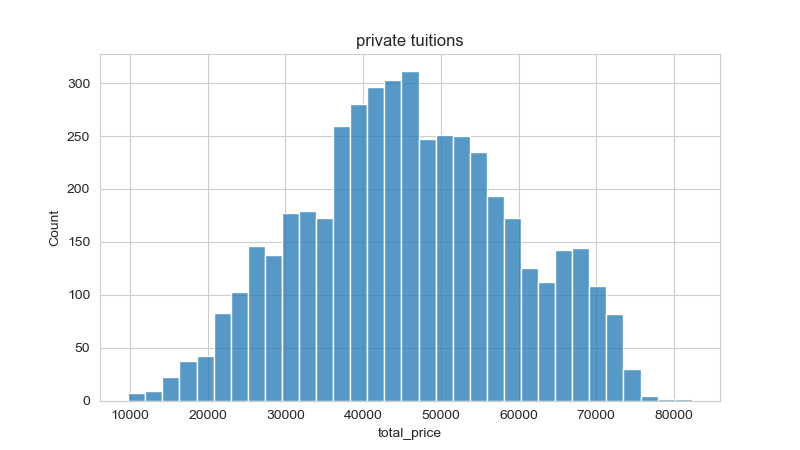

<IPython.core.display.Javascript object>


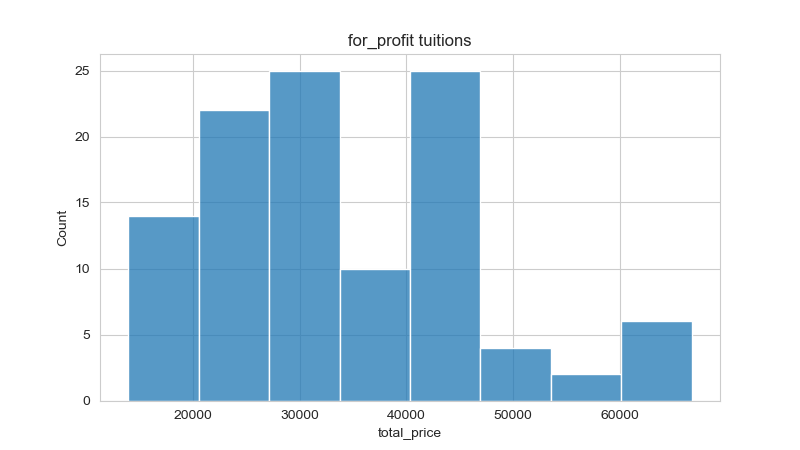

<IPython.core.display.Javascript object>


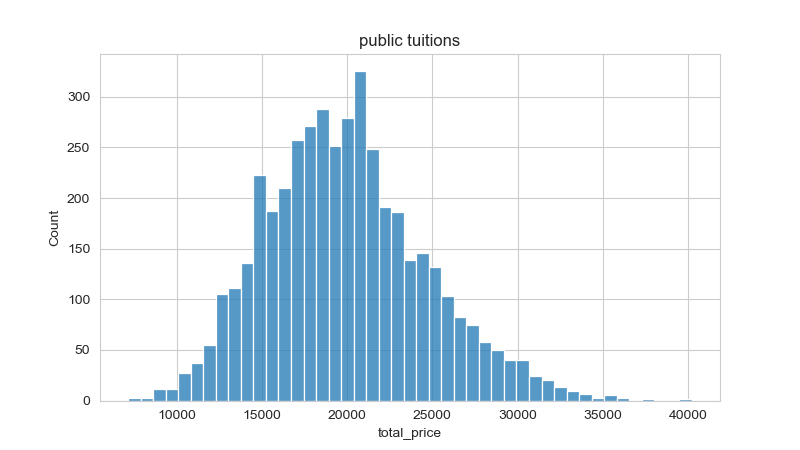

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
sns.set_style('whitegrid')

columns = {"for_profit", "private", "public"}
for column in columns:
    plt.figure(figsize=(8, 4.5))
    sns.histplot(data=inc_div_features[inc_div_features[column] == 1.0], x="total_price").set_title(
    column + " tuitions")
    plt.savefig("total-price-"+column+".png")

Target proportion vs cost visuals

In [90]:
targetProps = {"target1" : target1_vis_df, 
               "target2" : target2_vis_df, 
               "target3" : target3_vis_df, 
               "target4" : target4_vis_df, 
               "target5" : target5_vis_df}

In [80]:
targetProps["target1"]

,total_price,total_enrollment,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,target1,proportion
0,17030,291.0,8541.000000,7371.000000,0.000000,0.0,0.000000
1,17030,291.0,8541.000000,7371.000000,0.000000,0.0,0.000000
2,48300,4427.0,23184.630270,24835.948240,26151.120050,46.0,0.010391
3,45980,4427.0,22071.000000,23643.000000,24895.000000,46.0,0.010391
4,48300,4427.0,23184.630270,24835.948240,26151.120050,46.0,0.010391
...,...,...,...,...,...,...,...
9130,20510,6640.0,4936.642328,4926.170028,7659.440388,744.0,0.112048
9131,21068,6640.0,5070.949809,5060.192596,7867.824968,744.0,0.112048
9132,14764,4009.0,6057.890797,6545.768499,9734.756022,10.0,0.002494
9133,14254,4009.0,5848.630142,6319.654849,9398.483632,10.0,0.002494


<IPython.core.display.Javascript object>


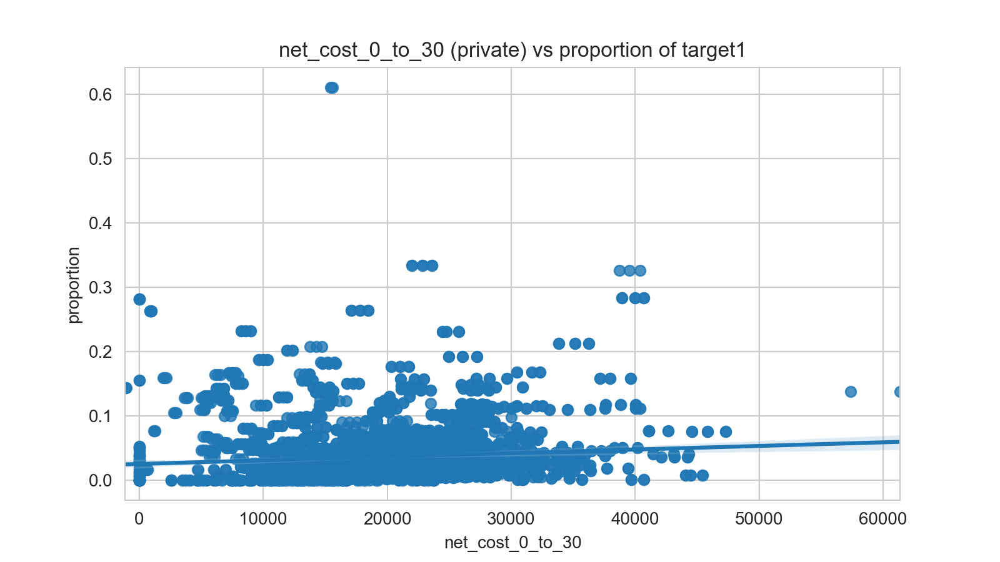

<IPython.core.display.Javascript object>


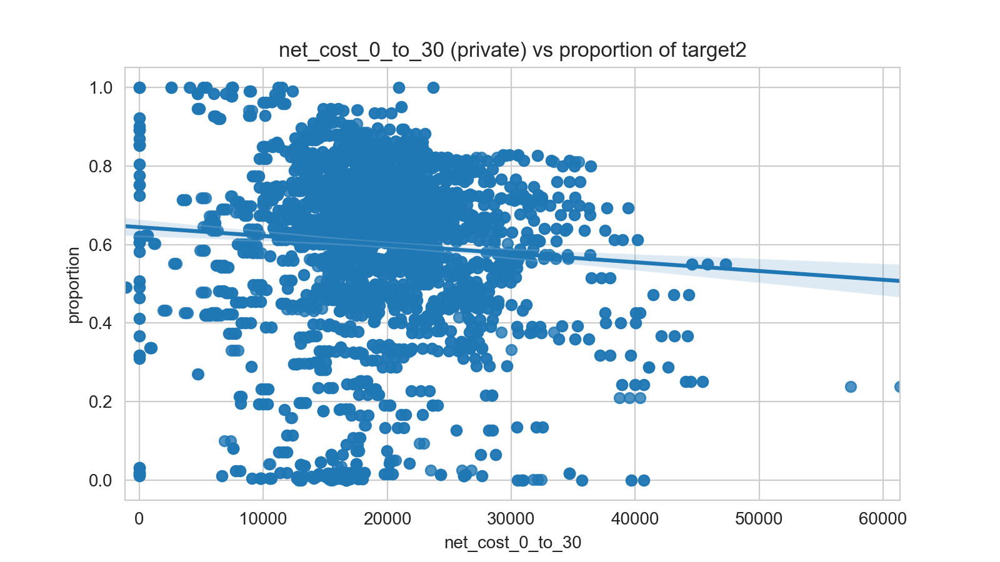

<IPython.core.display.Javascript object>


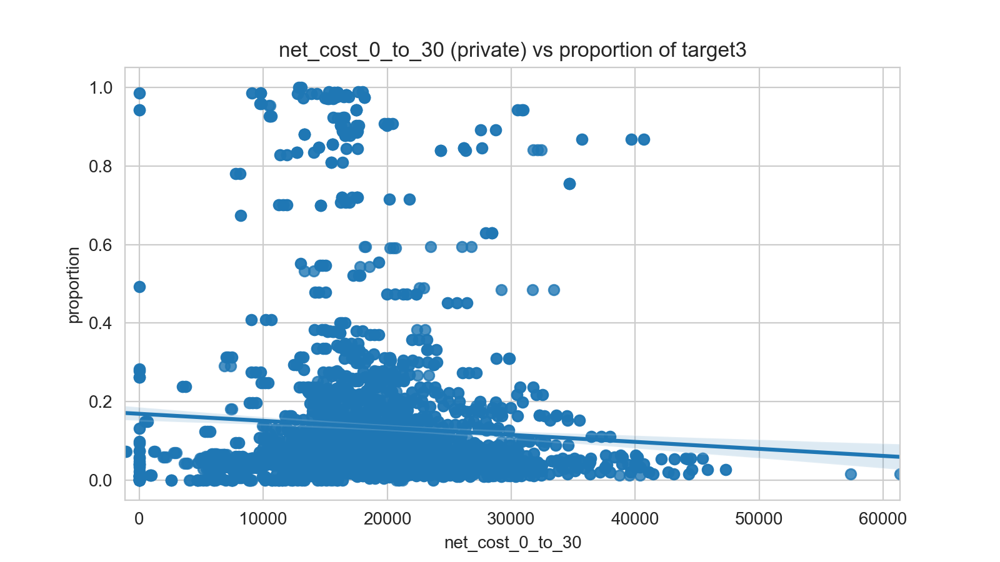

<IPython.core.display.Javascript object>


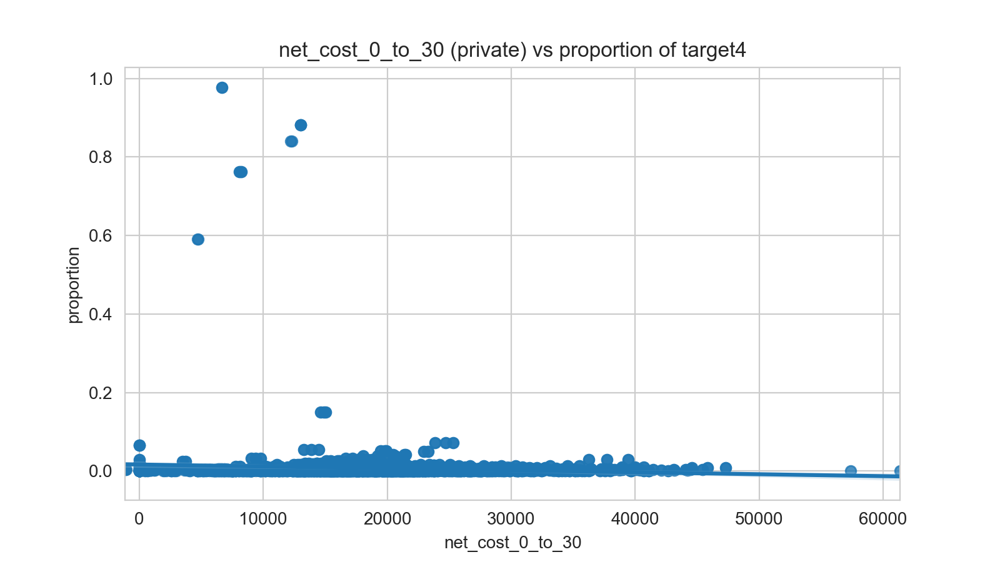

<IPython.core.display.Javascript object>


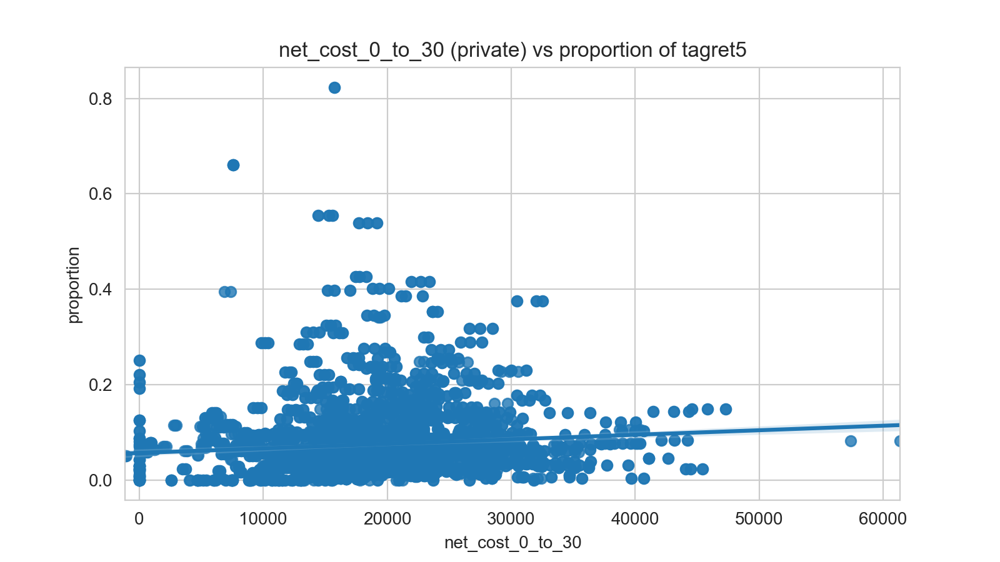

In [104]:
for group, targetProp in targetProps.items():
    plt.figure(figsize=(8, 4.5))
    sns.regplot(data=targetProp[targetProp["private"] == 1.0], x='net_cost_0_to_30', 
                                y="proportion").set_title("net_cost_0_to_30 (private) vs proportion of " + group)
    plt.savefig(group + "-0to30income-private-vs-prop.png")

<IPython.core.display.Javascript object>


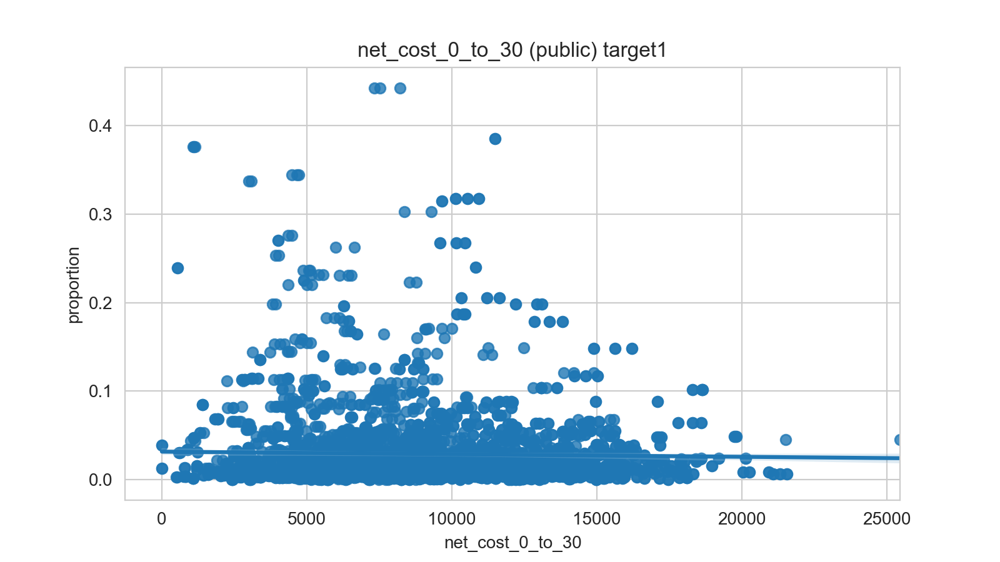

<IPython.core.display.Javascript object>


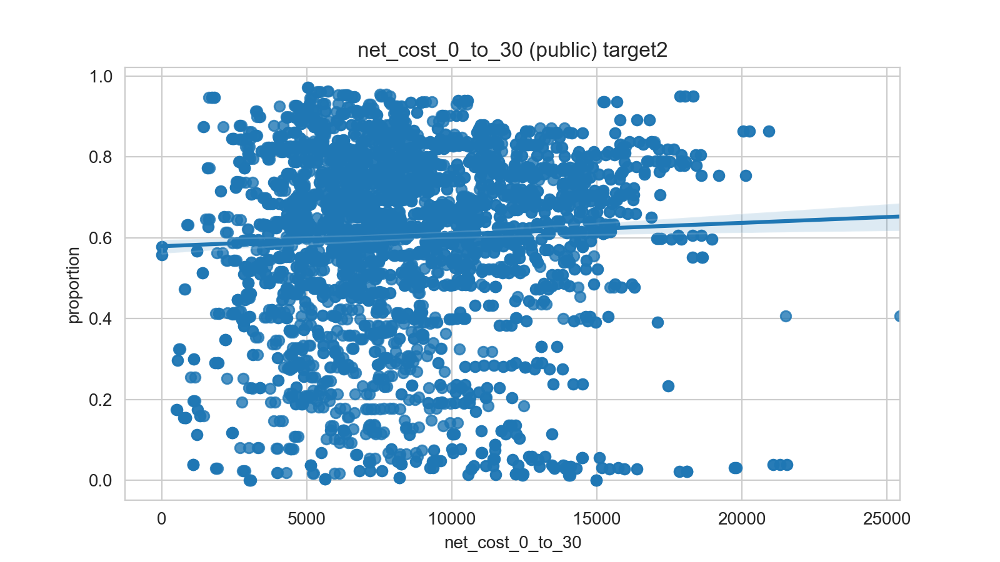

<IPython.core.display.Javascript object>


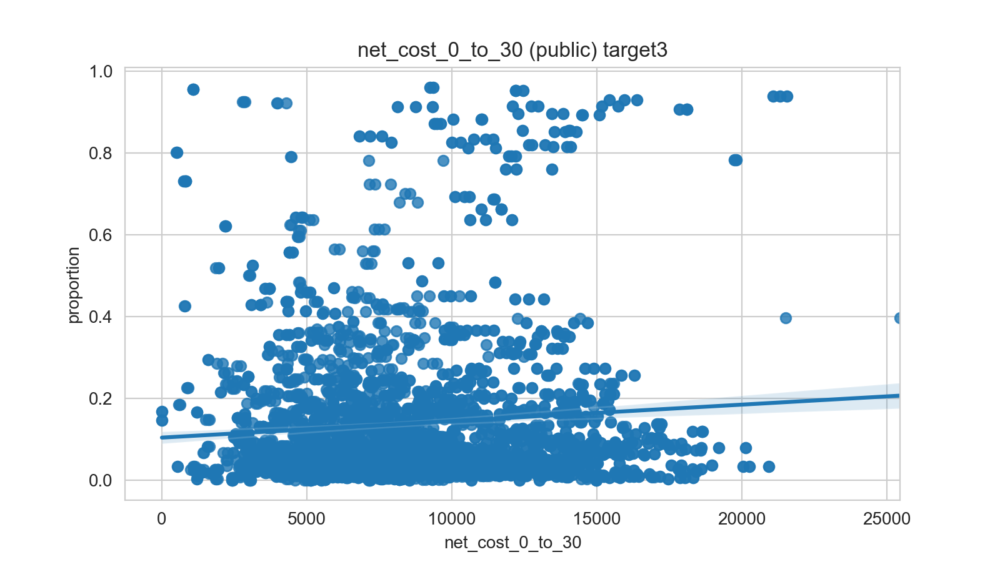

<IPython.core.display.Javascript object>


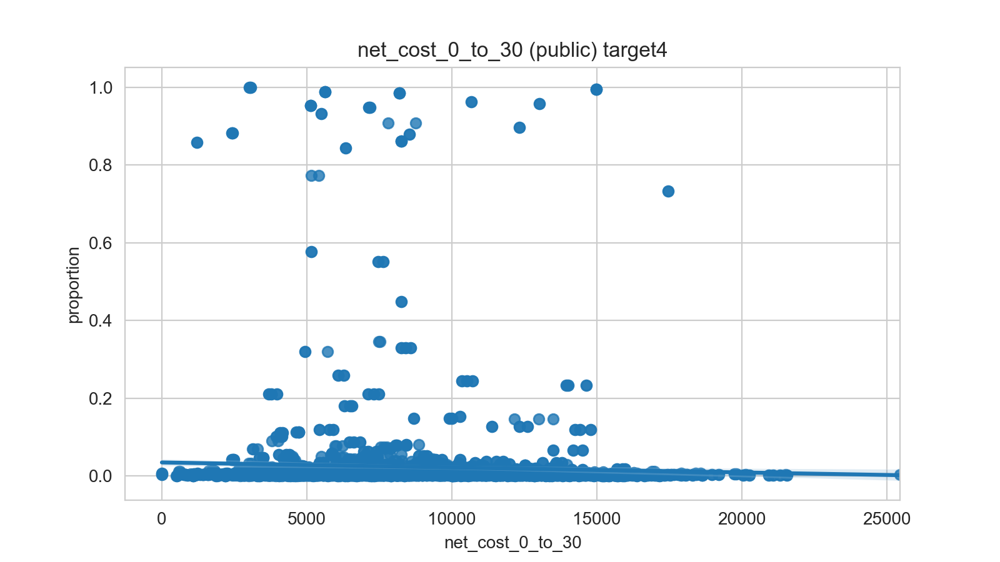

<IPython.core.display.Javascript object>


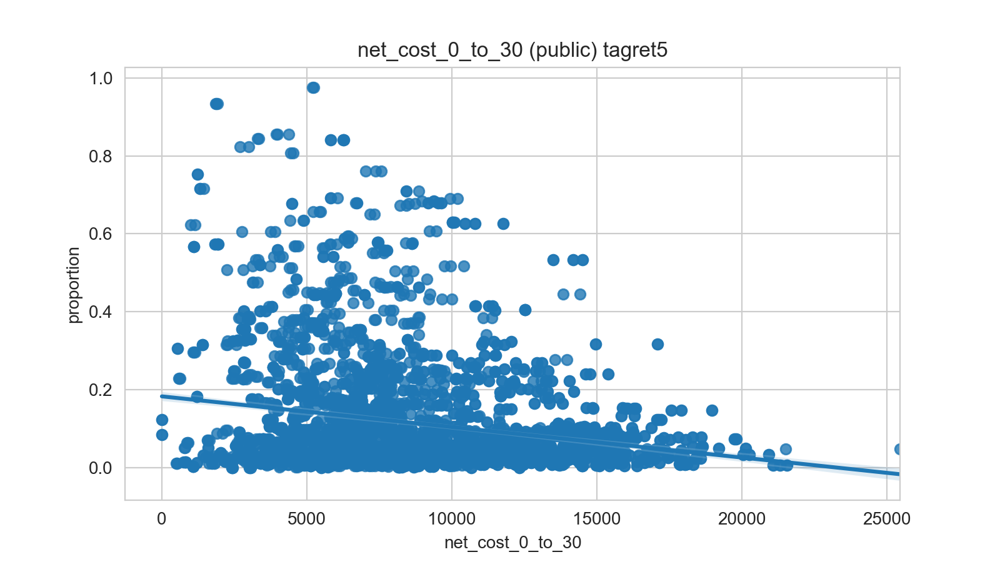

In [105]:
for group, targetProp in targetProps.items():
    plt.figure(figsize=(8, 4.5))
    sns.regplot(data=targetProp[targetProp["public"] == 1.0], x='net_cost_0_to_30', 
                                y="proportion").set_title("net_cost_0_to_30 (public) " + group)
    plt.savefig(group + "-0to30income-public-vs-prop.png")

<IPython.core.display.Javascript object>


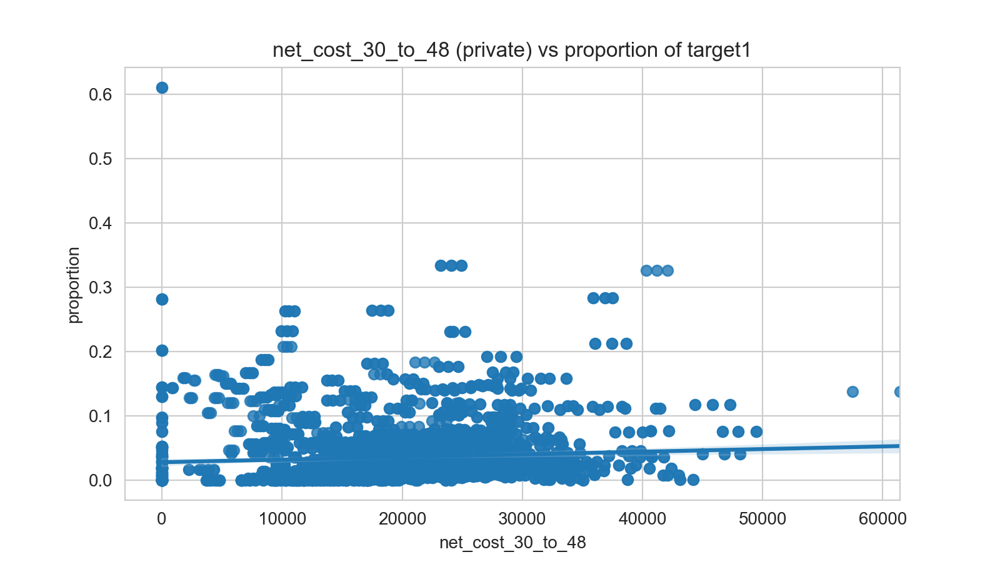

<IPython.core.display.Javascript object>


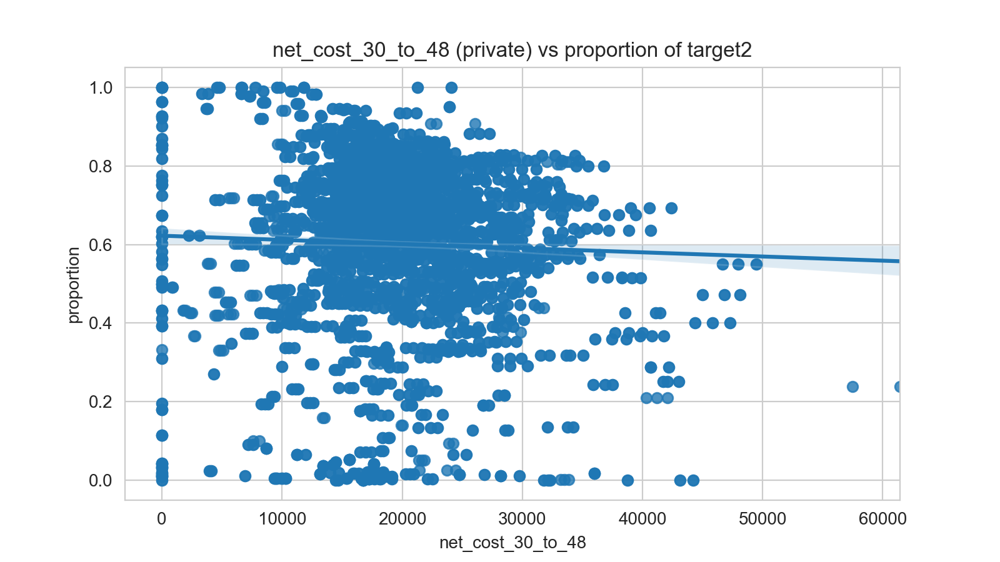

<IPython.core.display.Javascript object>


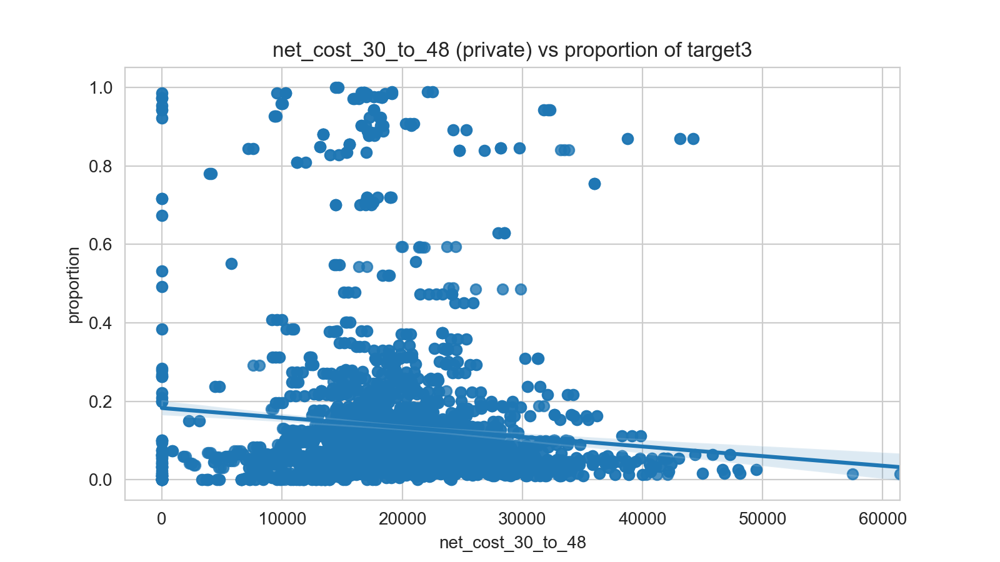

<IPython.core.display.Javascript object>


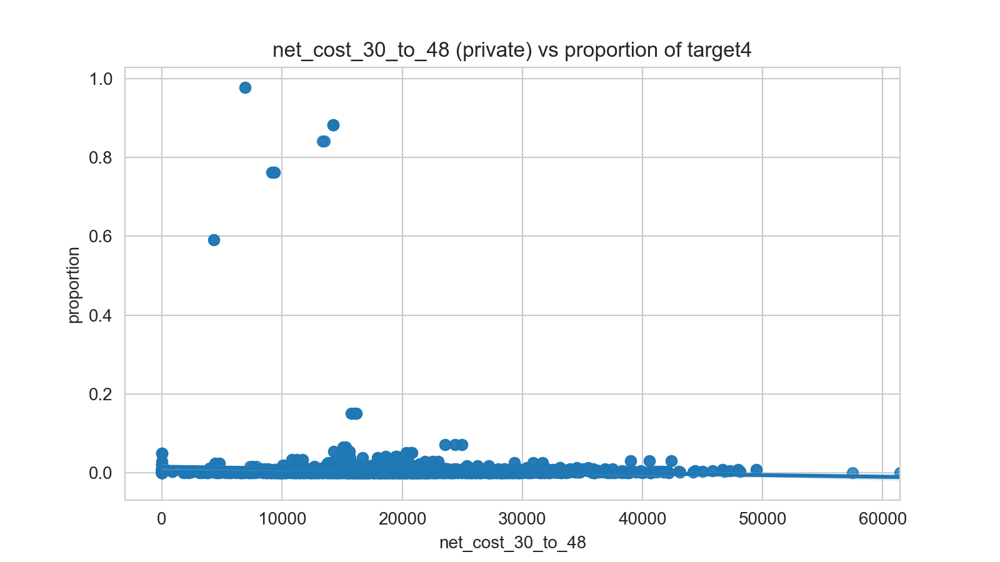

<IPython.core.display.Javascript object>


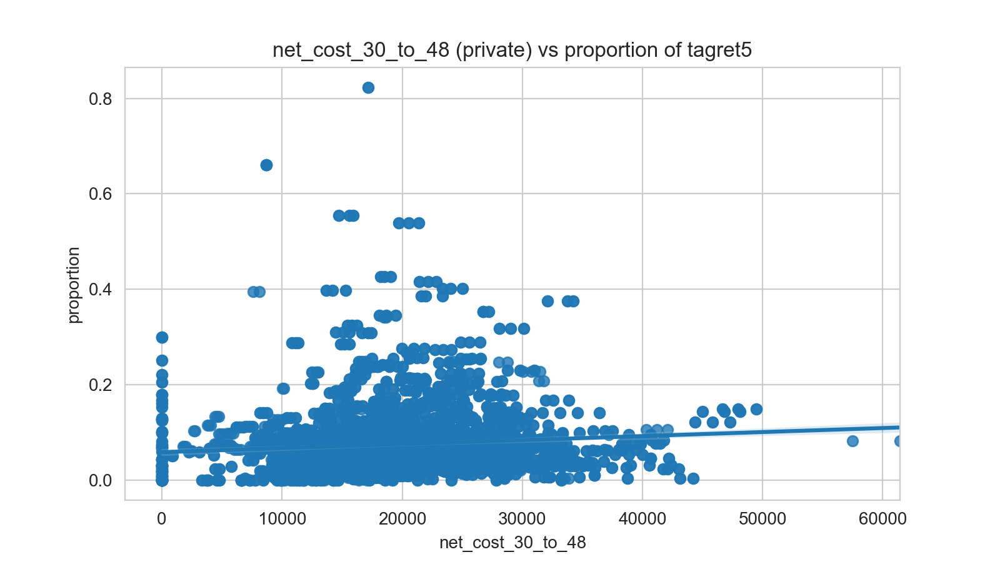

In [106]:
for group, targetProp in targetProps.items():
    plt.figure(figsize=(8, 4.5))
    sns.regplot(data=targetProp[targetProp["private"] == 1.0], x='net_cost_30_to_48', 
                                y="proportion").set_title("net_cost_30_to_48 (private) vs proportion of " + group)
    plt.savefig(group + "-30to48income-private-vs-prop.png")

<IPython.core.display.Javascript object>


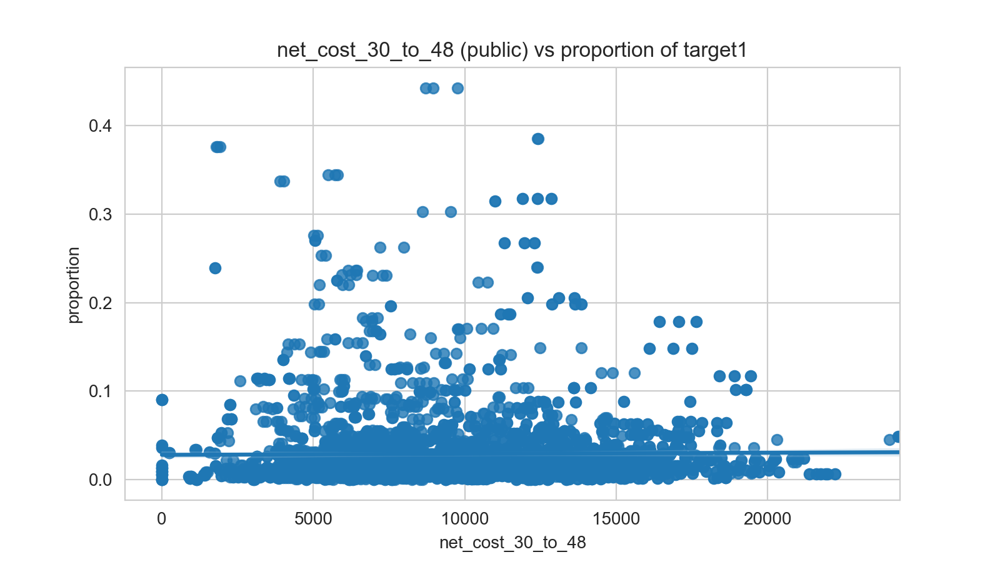

<IPython.core.display.Javascript object>


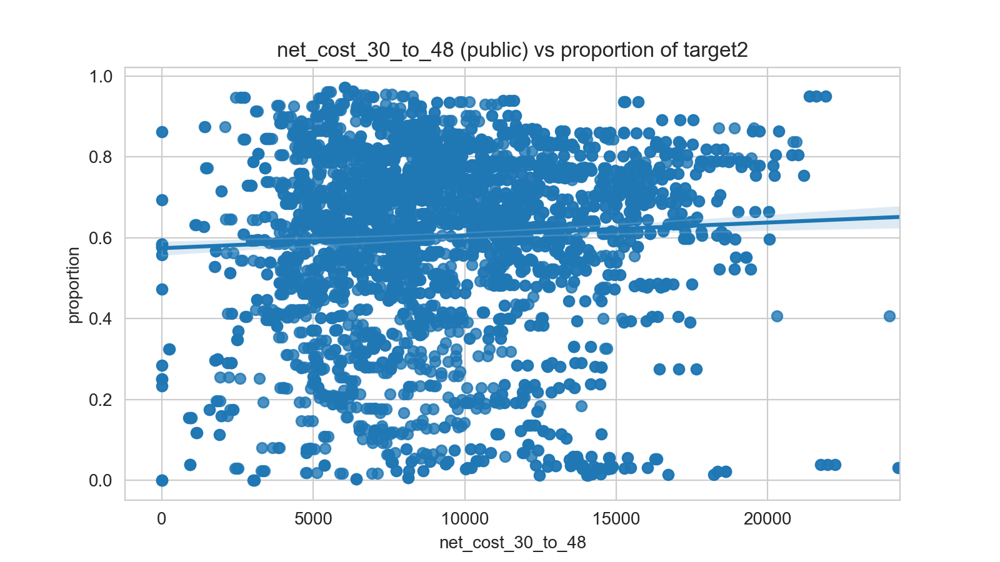

<IPython.core.display.Javascript object>


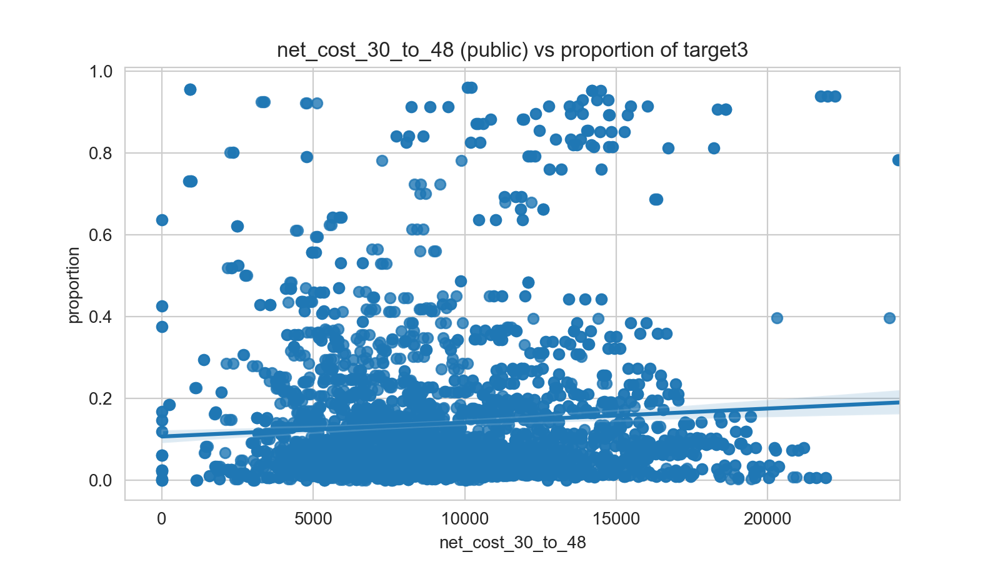

<IPython.core.display.Javascript object>


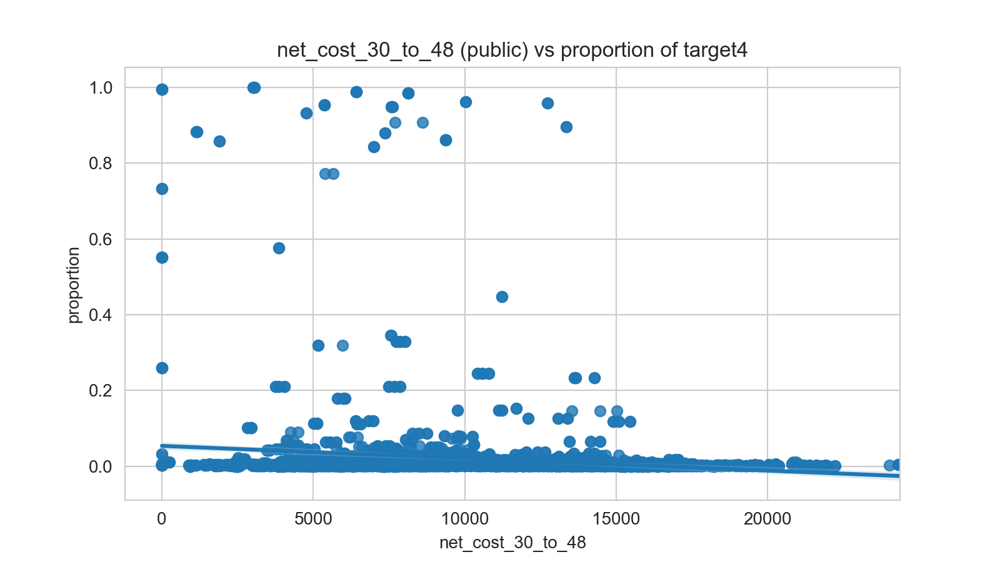

<IPython.core.display.Javascript object>


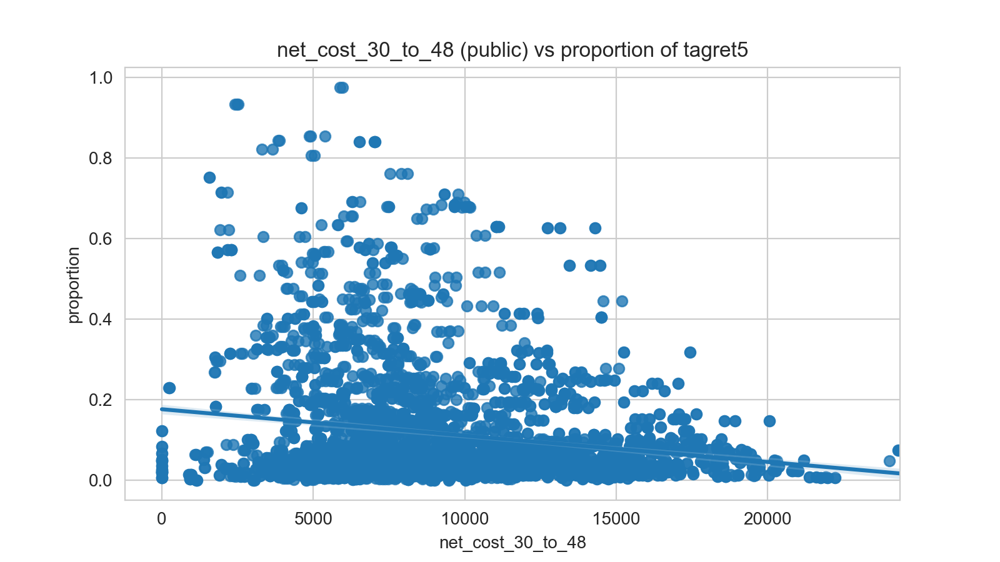

In [107]:
for group, targetProp in targetProps.items():
    plt.figure(figsize=(8, 4.5))
    sns.regplot(data=targetProp[targetProp["public"] == 1.0], x='net_cost_30_to_48', 
                                y="proportion").set_title("net_cost_30_to_48 (public) vs proportion of " + group)
    plt.savefig(group + "-30to48income-public-vs-prop.png")

End of target proportion vs cost visuals

<IPython.core.display.Javascript object>


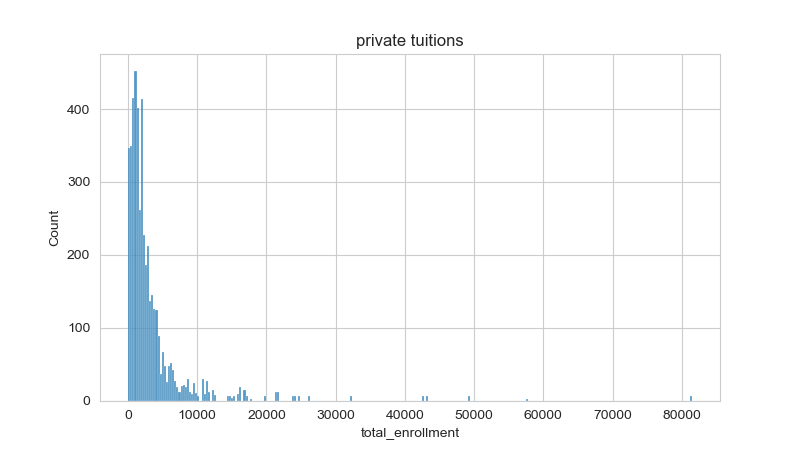

<IPython.core.display.Javascript object>


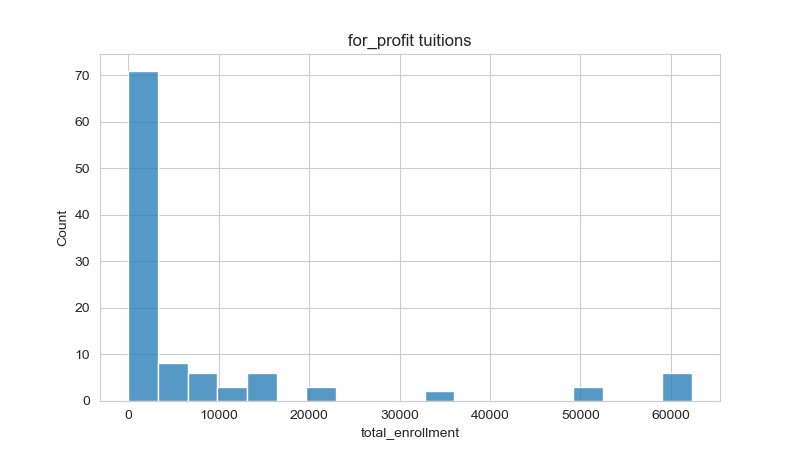

<IPython.core.display.Javascript object>


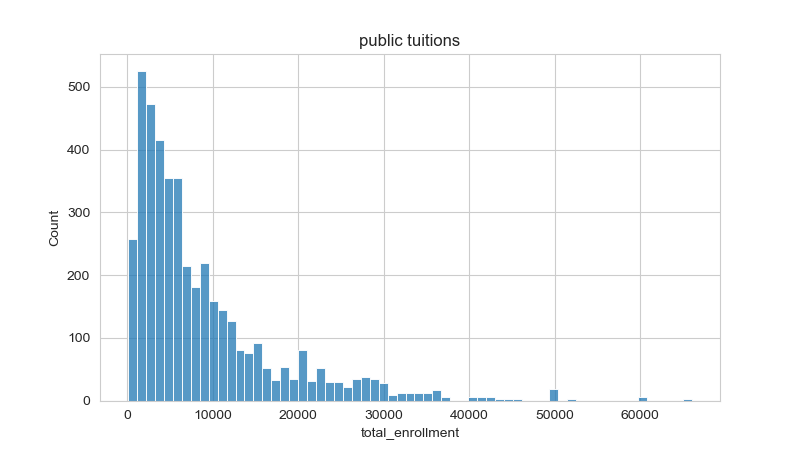

In [31]:
#histograms for school size
columns = {"for_profit", "private", "public"}
for column in columns:
    plt.figure(figsize=(8, 4.5))
    sns.histplot(data=inc_div_features[inc_div_features[column] == 1.0], x="total_enrollment").set_title(
    column + " tuitions")
    plt.savefig("corr"+column+".png")

<IPython.core.display.Javascript object>


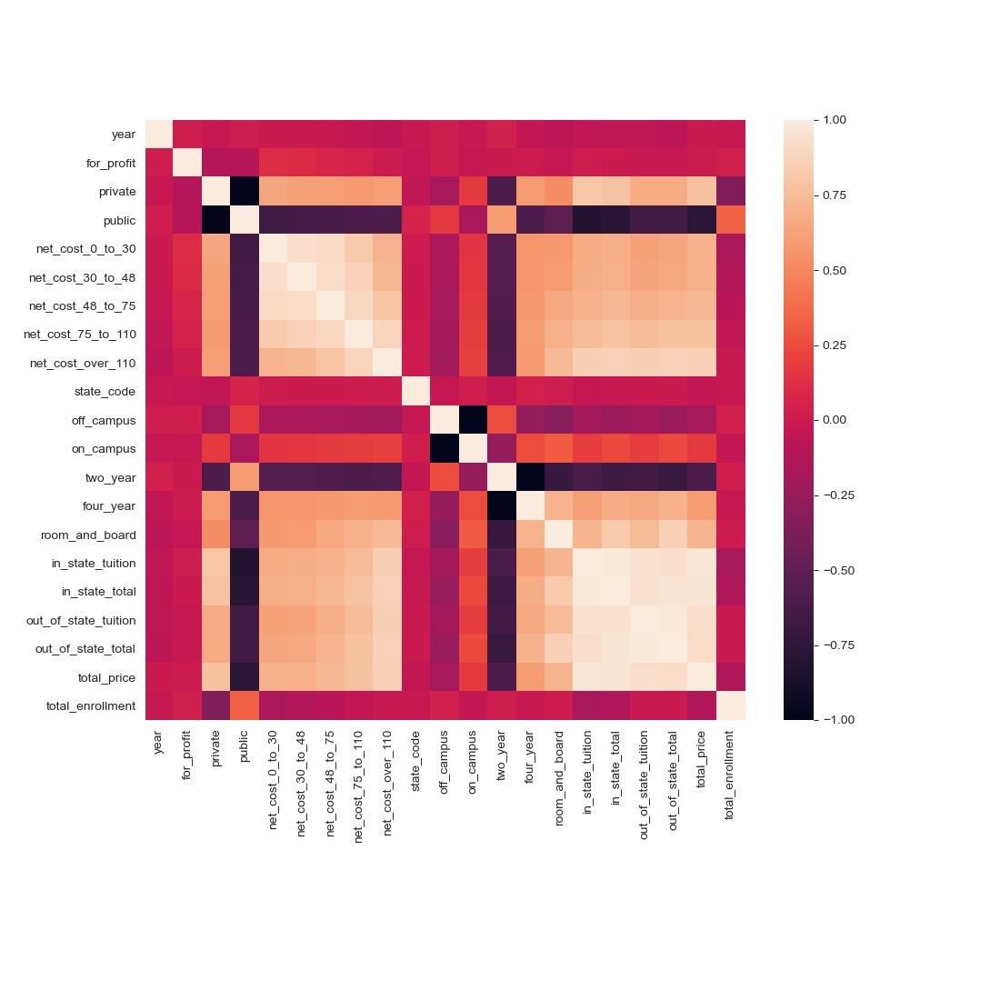

In [32]:
# heatmap showing correlations between all variables
plt.figure(figsize=(11, 11))
sns.heatmap(inc_div_features.corr(), square=True, annot=False)
plt.subplots_adjust(bottom=0.28)
plt.savefig("all-corrs.png")
plt.show()

<IPython.core.display.Javascript object>


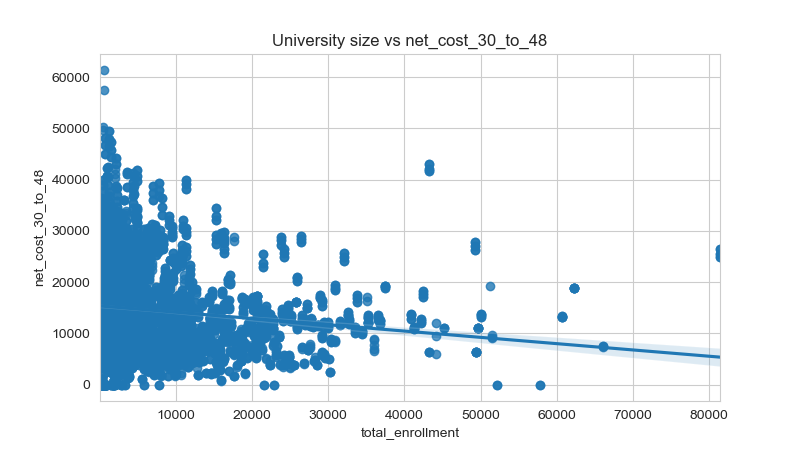

<IPython.core.display.Javascript object>


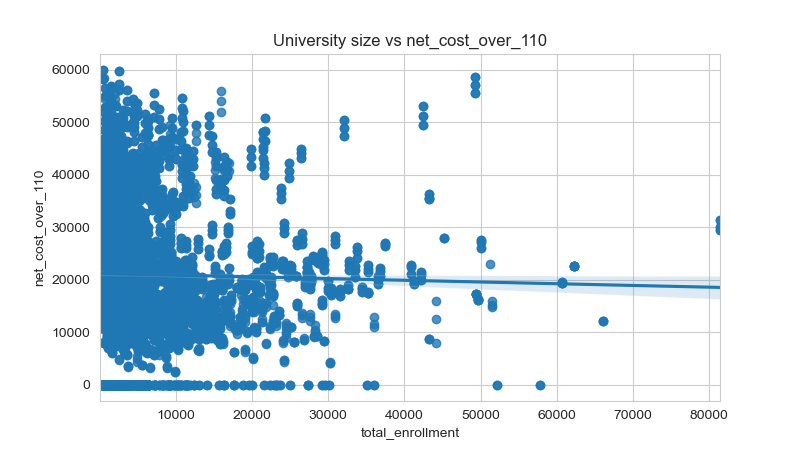

<IPython.core.display.Javascript object>


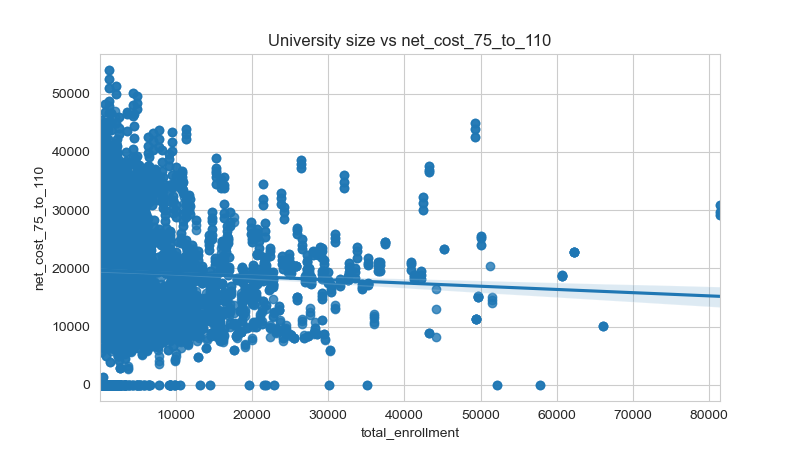

<IPython.core.display.Javascript object>


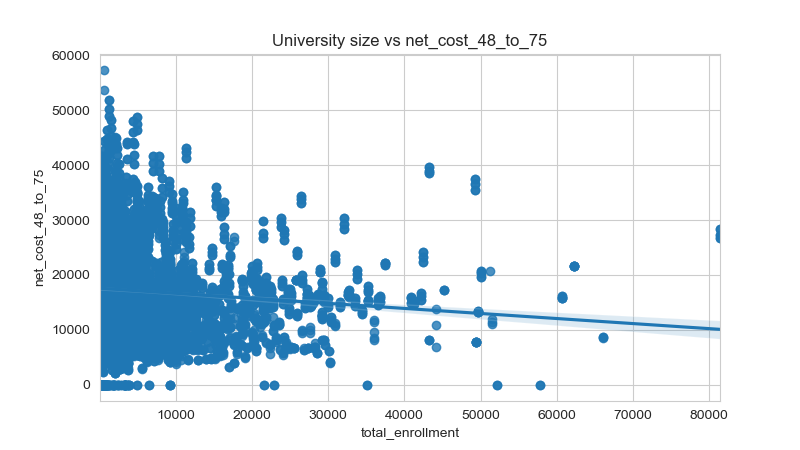

<IPython.core.display.Javascript object>


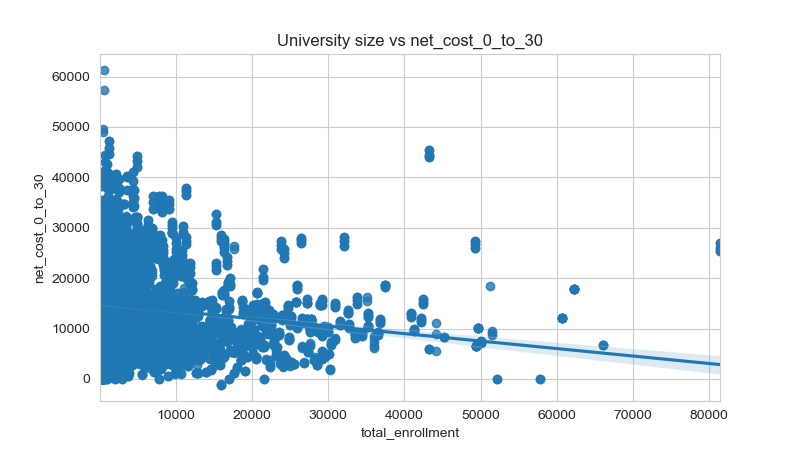

In [33]:

columns_mon = {"net_cost_0_to_30", "net_cost_30_to_48", 
               "net_cost_48_to_75", "net_cost_75_to_110", "net_cost_over_110"}
for column in columns_mon:
    plt.figure(figsize=(8, 4.5))  # 8"-by-4.5" Figure
    sns.regplot(data=inc_div_features, x='total_enrollment', y=column).set_title("University size vs " + column)
    plt.savefig("corr"+column+".png")
    
#takeaway; it seems that despite some variation, especially in the smaller schools,
#there isn't much of a correlation

<IPython.core.display.Javascript object>


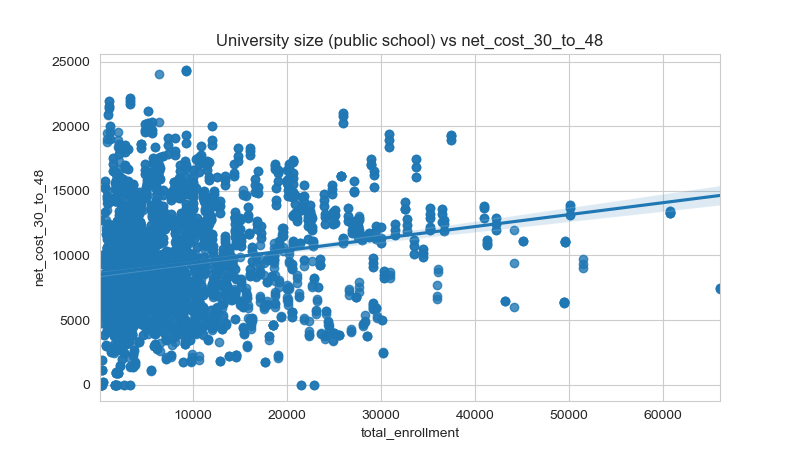

<IPython.core.display.Javascript object>


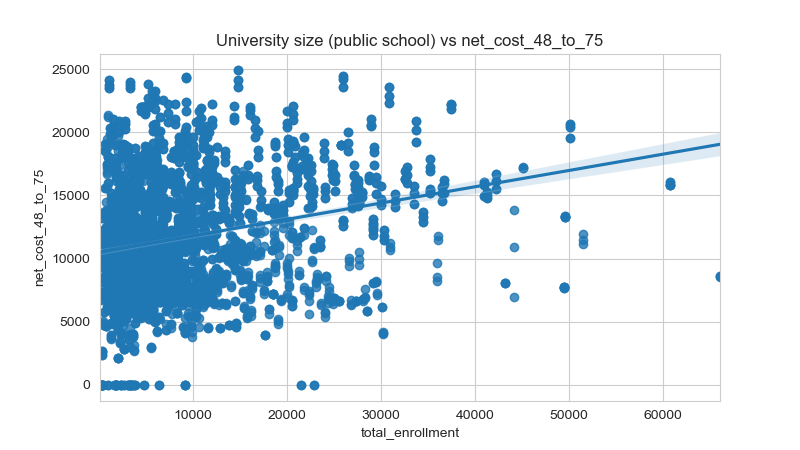

<IPython.core.display.Javascript object>


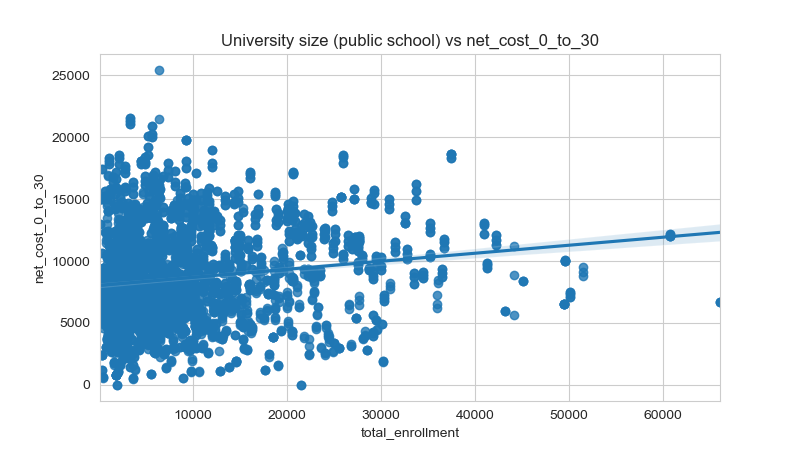

In [34]:
columns_mon_2 = {"net_cost_0_to_30", "net_cost_30_to_48", "net_cost_48_to_75"}

for column in columns_mon_2:
    plt.figure(figsize=(8, 4.5))  # 8"-by-4.5" Figure
    sns.regplot(data=inc_div_features[inc_div_features["public"] == 1.0], x='total_enrollment', y=column).set_title(
        "University size (public school) vs " + column)
    plt.savefig("corr"+column+"total-enrollement(public).png")
#public schools show an upward trend for their tuition    

<IPython.core.display.Javascript object>


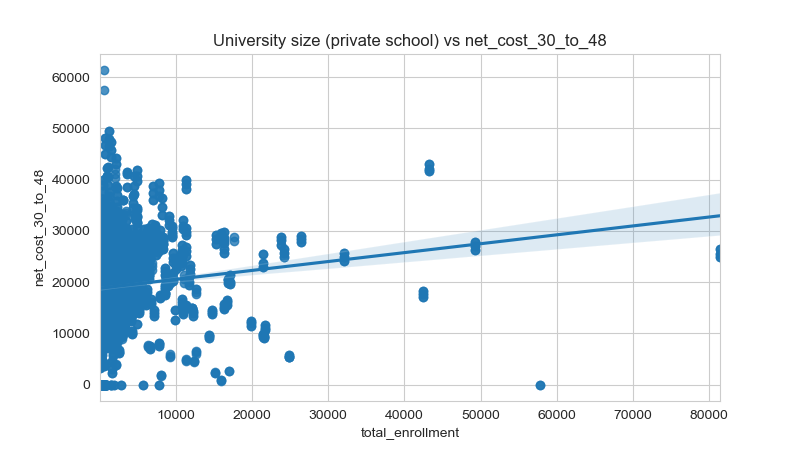

<IPython.core.display.Javascript object>


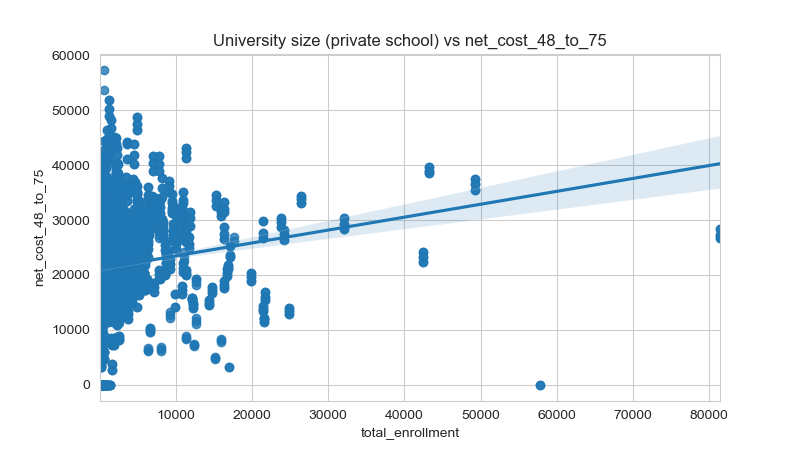

<IPython.core.display.Javascript object>


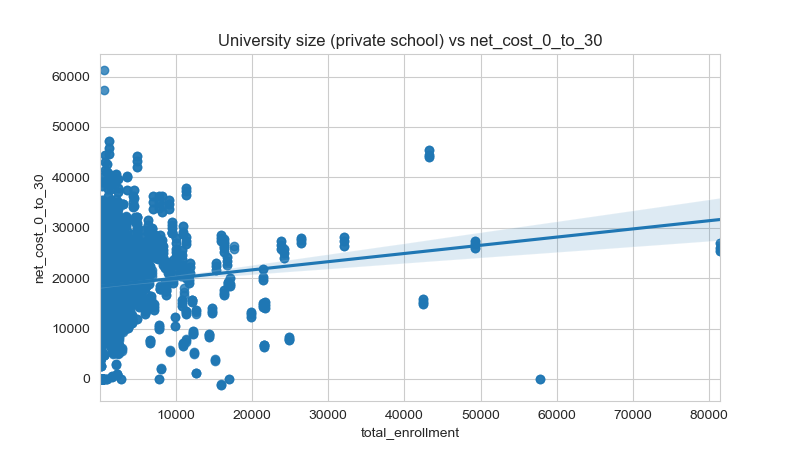

In [35]:
for column in columns_mon_2:
    plt.figure(figsize=(8, 4.5))  # 8"-by-4.5" Figure
    sns.regplot(data=inc_div_features[inc_div_features["private"] == 1.0], x='total_enrollment', y=column).set_title(
        "University size (private school) vs " + column)
    plt.savefig("corr"+column+"total-enrollement(private).png")
#private schools also show an upward trend for their tuition    

<IPython.core.display.Javascript object>


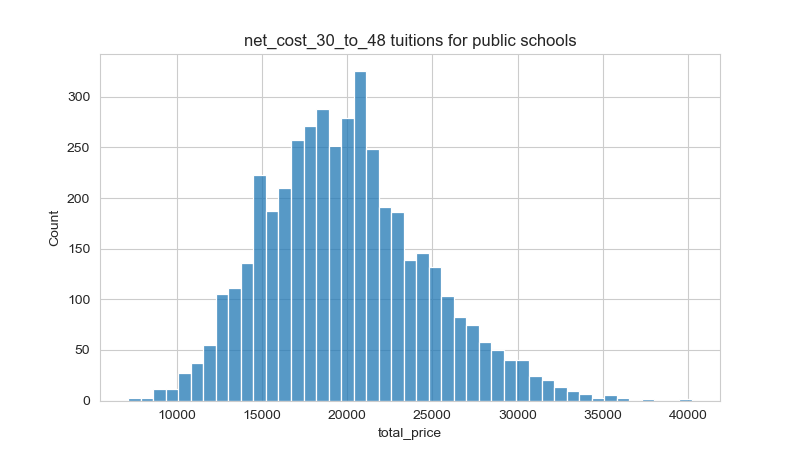

<IPython.core.display.Javascript object>


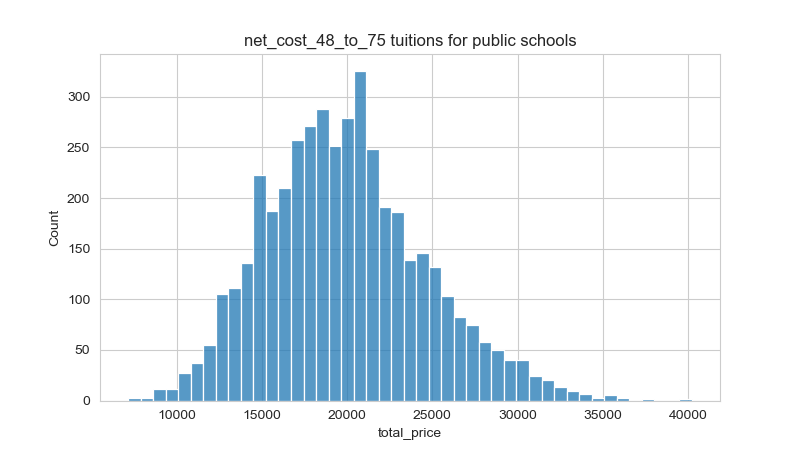

<ipython-input-36-68aa02a3b67f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8, 4.5))


<IPython.core.display.Javascript object>


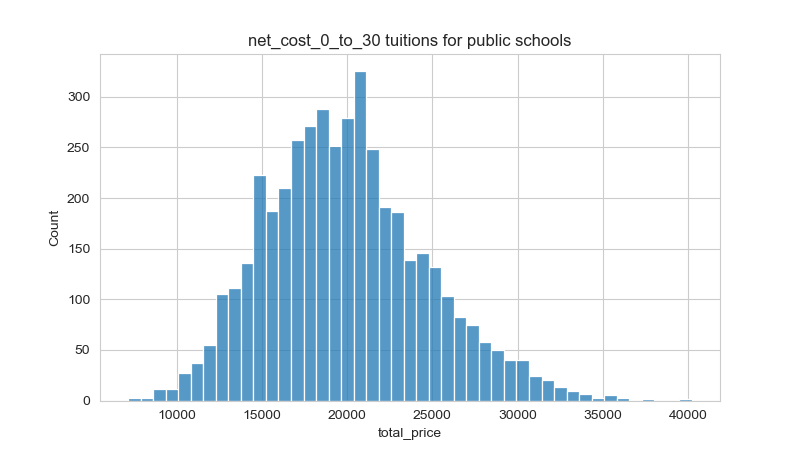

In [36]:
#tuitions for public schools
columns2 = {"net_cost_0_to_30", "net_cost_30_to_48", "net_cost_48_to_75"}
for column in columns2:
    plt.figure(figsize=(8, 4.5))
    sns.histplot(data=inc_div_features[inc_div_features["public"] == 1.0], x="total_price").set_title(
    column + " tuitions for public schools" )
    plt.savefig("tuition-cost-"+column+"-public.png")

<IPython.core.display.Javascript object>


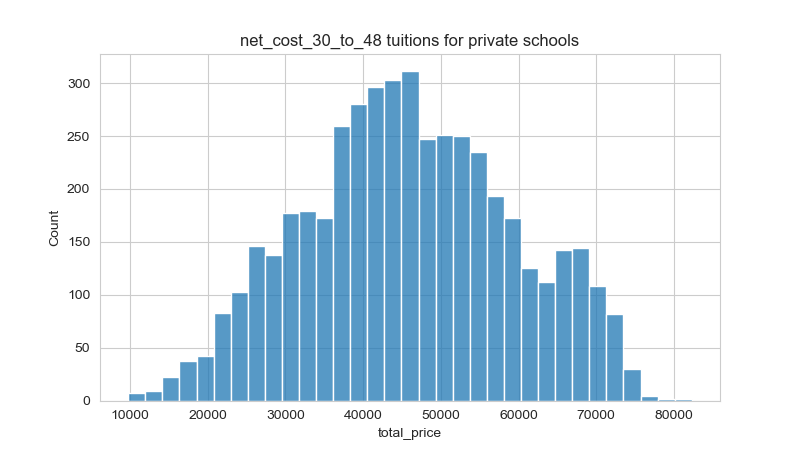

<IPython.core.display.Javascript object>


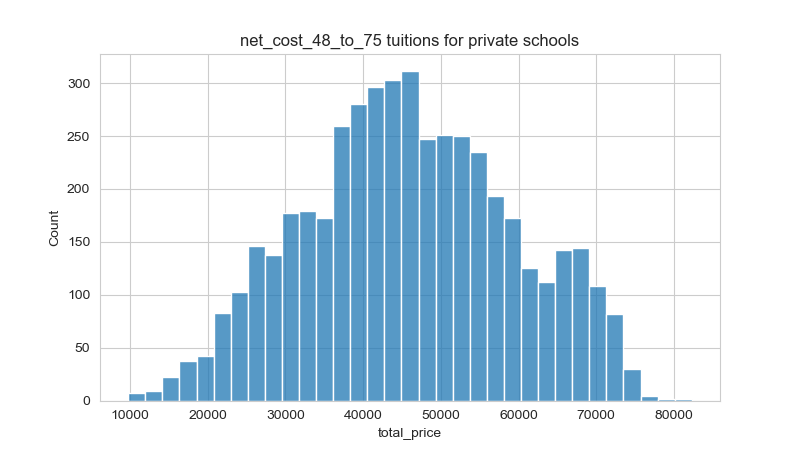

<IPython.core.display.Javascript object>


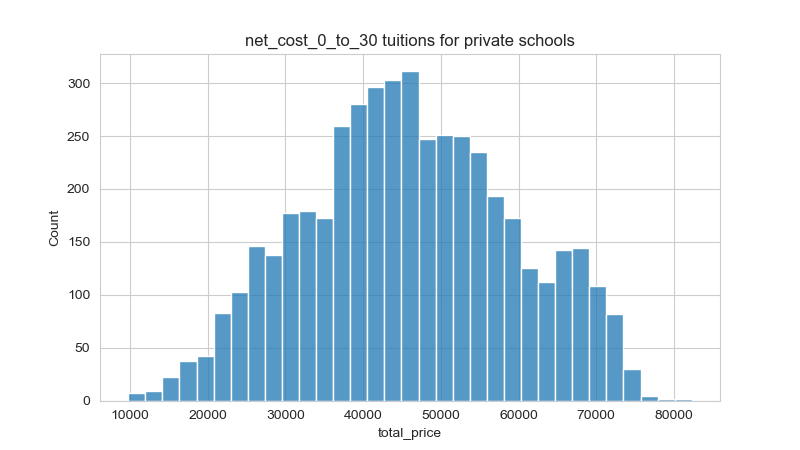

In [37]:
#tuitions for private schools
for column in columns2:
    plt.figure(figsize=(8, 4.5))
    sns.histplot(data=inc_div_features[inc_div_features["private"] == 1.0], x="total_price").set_title(
    column + " tuitions for private schools" )
    plt.savefig("tuition-cost-"+column+"-private.png")

<IPython.core.display.Javascript object>


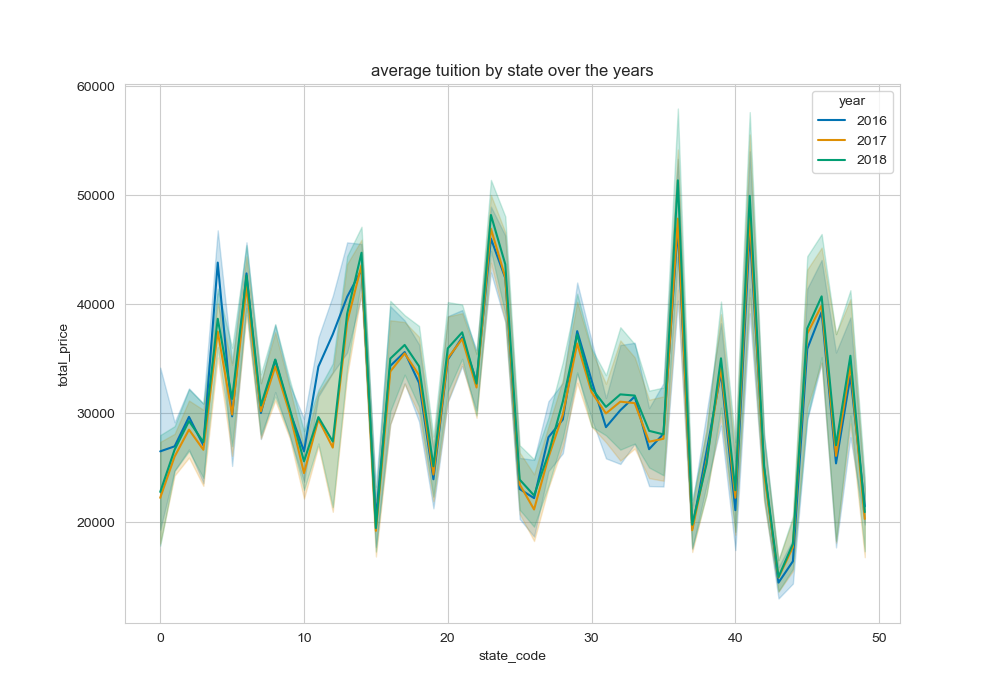

In [38]:
plt.figure(figsize=(10, 7))
sns.lineplot(data=inc_div_features, palette = "colorblind", x = "state_code", y="total_price", hue="year").set_title(
    "average tuition by state over the years")
plt.savefig("ave-cost-by-state.png")

Training the data and applying Lasso, kNN, and Ridge regression models:

In [39]:
#creating a dictionary of estimators
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge


estimators = {"Lasso Regression" : Lasso(tol=0.1, alpha=0.001),
              "kNN" : KNeighborsRegressor(),
              "Ridge Regression" : Ridge(alpha = 100)}
              
inc_div_scaled_features = inc_div_scaled.iloc[:,0:20]

#creating a dictionary of ethnic groups
ethnic_group = {"Asian" : (inc_div_scaled_features, target1), 
                "Black" : (inc_div_scaled_features, target3), 
                "Hispanic" : (inc_div_scaled_features, target5), 
                "Native American/Alaskan" : (inc_div_scaled_features, target4), 
                "White" : (inc_div_scaled_features, target2)}

In [40]:
#split data into training and testing sets, will be used for each feature
from sklearn.model_selection import train_test_split

def split_train_test(features, target) :
    split = train_test_split(features, target, random_state = 3000)
    return split

In [41]:
#for each ethnic group, add to a dictionary with its own training and testing set that can be used for 
#intial application of regressors and after tuning

def target_ML_sets() :
    ethnic_ML_sets = {}
    for ethnicity, dataset in ethnic_group.items() :
        feature_set, target_set = dataset
        ethnic_ML_sets[ethnicity] = split_train_test(feature_set, target_set)
    return ethnic_ML_sets

ethnic_ML_sets = target_ML_sets()

In [42]:
#function applies regressors
#evaluates performance using r^2 values and mean-squared-error values 
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

def apply_algorithms() :
    for ethnicity, train_test_sets in ethnic_ML_sets.items() :
        print("\tLooking at ", ethnicity, " target group:", sep="")
        print("\t–––––––––––––––––––––––––––––––––––––––")
        X_train, X_test, y_train, y_test = train_test_sets
        for estimator, algorithm in estimators.items() :
            model = algorithm.fit(X=X_train, y=y_train)
        
            print("\t", estimator, ":", sep="")
            print("\t\t", "R-squared value for training set:  ", r2_score(y_train, model.predict(X_train)), sep="")
            print("\t\t", "R-squared value for testing set:  ", r2_score(y_test, model.predict(X_test)), sep="")
            print("\t\t", "MSE value for training set:  ", mean_squared_error(y_train, model.predict(X_train)), sep="")
            print("\t\t", "MSE value for testing set:  ", mean_squared_error(y_test, model.predict(X_test)), sep="")
            print("\n")
        print("\t========================================")

In [43]:
#Feature selection using K-Best Selection: want to retain the best 12 features
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

def apply_algorithms_selected() :
    selected = []
    for ethnicity, train_test_sets in ethnic_ML_sets.items() :
        print("\tLooking at ", ethnicity, " target group:", sep="")
        print("\t–––––––––––––––––––––––––––––––––––––––")
        X_train, X_test, y_train, y_test = train_test_sets
        
        #feature selection
        select = SelectKBest(score_func = f_regression, k=12)
        select.fit(X_train, y_train)
        #transform sets
        X_train_selected = select.transform(X_train)
        X_test_selected = select.transform(X_test)
        selected.append(select)
        #the selected features
        print("\tSelected features after RFE:")
        for i in range(len(inc_div_scaled_features.columns)):
            if select.get_support()[i] == True:
                print("\t", inc_div_scaled_features.columns[i])
        print("\n", end="")
        for estimator, algorithm in estimators.items() :
            model = algorithm.fit(X=X_train_selected, y=y_train)
        
            print("\t", estimator, ":", sep="")
            print("\t\t", "R-squared value for training set:  ", r2_score(y_train, model.predict(X_train_selected)), sep="")
            print("\t\t", "R-squared value for testing set:  ", r2_score(y_test, model.predict(X_test_selected)), sep="")
            print("\t\t", "MSE value for training set:  ", mean_squared_error(y_train, model.predict(X_train_selected)), sep="")
            print("\t\t", "MSE value for testing set:  ", mean_squared_error(y_test, model.predict(X_test_selected)), sep="")
            print("\n")
        print("\t========================================")
    return selected

from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import numpy as np

def apply_algorithms(training_dict) :
    X_train, X_test, y_train, y_test = training_dict["Asian"]
    for estimator, algorithm in estimators.items() :
        model = algorithm.fit(X=X_train, y=y_train)
        
        print(estimator, ":", sep="")
        print("\t", "R-squared value for training set:  ", r2_score(y_train, model.predict(X_train)), sep="")
        print("\t", "MSE value for training set:  ", np.sqrt(mean_squared_error(y_train, model.predict(X_train))), sep="")
        print("\t", "R-squared value for testing set:  ", r2_score(y_test, model.predict(X_test)), sep="")
        print("\t", "MSE value for testing set:  ", np.sqrt(mean_squared_error(y_test, model.predict(X_test))), sep="")
        print("\n")
    print("========================================")

In [44]:
#compare running models with all features and with selected features
print("MODEL TRAINING WITH ALL FEATURES\n")
apply_algorithms()

print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~\n")
print("MODEL TRAINING WITH SELECTED FEATURES\n")
selected = apply_algorithms_selected()

MODEL TRAINING WITH ALL FEATURES

	Looking at Asian target group:
	–––––––––––––––––––––––––––––––––––––––
	Lasso Regression:
		R-squared value for training set:  0.16636915131527152
		R-squared value for testing set:  0.16775699973624536
		MSE value for training set:  464049.5587240634
		MSE value for testing set:  630345.5208570525


	kNN:
		R-squared value for training set:  0.6056386679713359
		R-squared value for testing set:  0.5260097906143855
		MSE value for training set:  219525.46789081887
		MSE value for testing set:  359002.845709282


	Ridge Regression:
		R-squared value for training set:  0.155927848279779
		R-squared value for testing set:  0.15155253682380632
		MSE value for training set:  469861.82211830944
		MSE value for testing set:  642618.8720435606


	Looking at Black target group:
	–––––––––––––––––––––––––––––––––––––––
	Lasso Regression:
		R-squared value for training set:  0.1500329075321417
		R-squared value for testing set:  0.15794854395958113
		MSE value 

	 total_price

	Lasso Regression:
		R-squared value for training set:  0.2271147244139059
		R-squared value for testing set:  0.21006979165617345
		MSE value for training set:  14113546.913034094
		MSE value for testing set:  17009955.563480984


	kNN:
		R-squared value for training set:  0.7871024155467669
		R-squared value for testing set:  0.6720624937754351
		MSE value for training set:  3887692.185070792
		MSE value for testing set:  7061639.55949212


	Ridge Regression:
		R-squared value for training set:  0.22634929443688934
		R-squared value for testing set:  0.20934851279501487
		MSE value for training set:  14127524.31981167
		MSE value for testing set:  17025487.215831526




In [45]:
selected_features_asian = pd.DataFrame()
for i in range(len(inc_div_scaled_features.columns)):
          if selected[0].get_support()[i] == True:
             selected_features_asian[inc_div_scaled_features.columns[i]] = inc_div_scaled[inc_div_scaled_features.columns[i]]
selected_features_asian

,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_over_110,state_code,off_campus,on_campus,room_and_board,out_of_state_tuition,out_of_state_total,total_price
0,0.0,1.0,-0.711497,-0.916142,-1.742428,0,1.0,0.0,-1.625550,-1.491718,-1.607814,-0.987779
1,0.0,1.0,-0.711497,-0.916142,-1.742428,0,1.0,0.0,-1.625550,-1.491718,-1.607814,-0.987779
2,1.0,0.0,1.183339,1.285896,0.842820,1,0.0,1.0,0.458436,0.843117,0.781185,0.905391
3,1.0,0.0,1.039239,1.135485,0.718642,1,0.0,1.0,0.458436,0.843117,0.781185,0.764932
4,1.0,0.0,1.183339,1.285896,0.842820,1,1.0,0.0,0.458436,0.843117,0.781185,0.905391
...,...,...,...,...,...,...,...,...,...,...,...,...
9130,0.0,1.0,-1.177888,-1.224394,-1.476516,4,1.0,0.0,-1.625550,-1.057397,-1.270832,-0.777090
9131,0.0,1.0,-1.160509,-1.207496,-1.469281,4,1.0,0.0,-1.625550,-1.057397,-1.270832,-0.743308
9132,0.0,1.0,-1.032803,-1.020190,-0.853078,17,1.0,0.0,-1.625550,-0.948817,-1.186587,-1.124969
9133,0.0,1.0,-1.059880,-1.048699,-0.883799,17,1.0,0.0,-1.625550,-0.948817,-1.186587,-1.155846


<IPython.core.display.Javascript object>


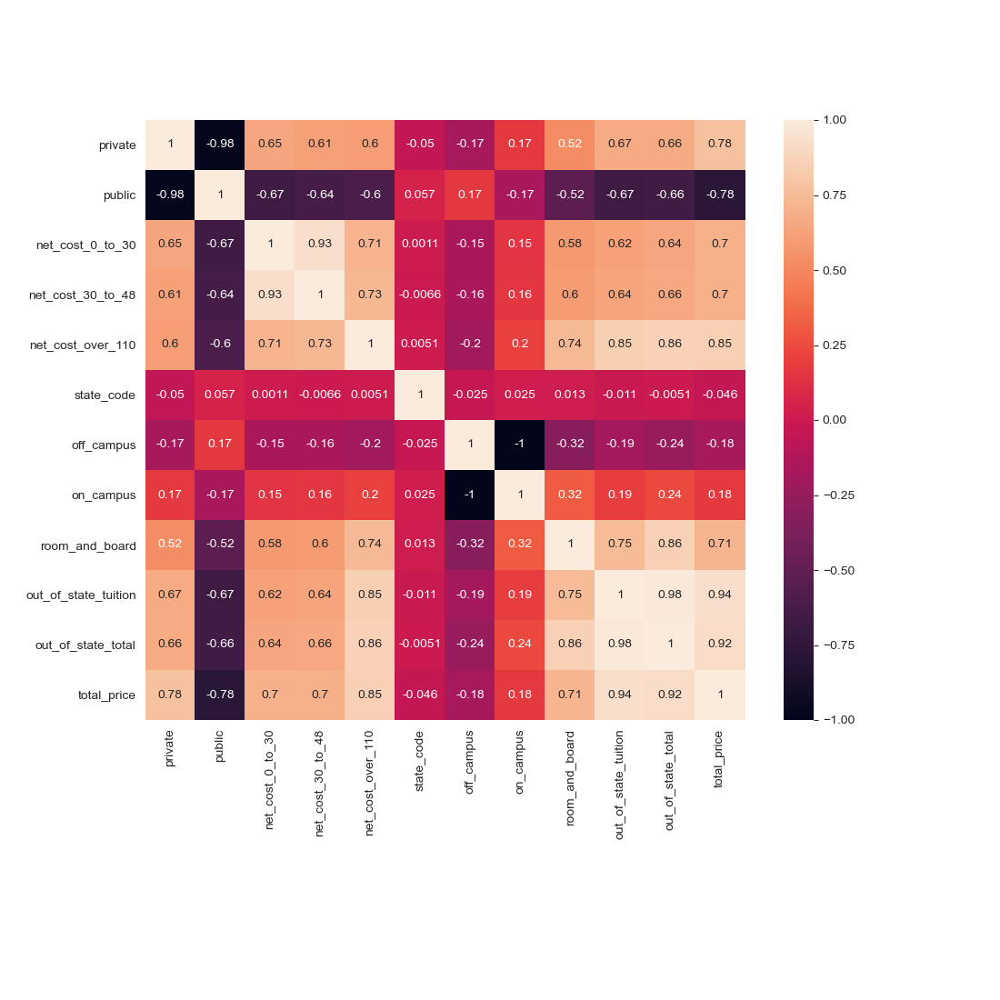

In [46]:
plt.figure(figsize=(11, 11))
sns.heatmap(selected_features_asian.corr(), square=True, annot=True)
plt.subplots_adjust(bottom=0.28)
plt.savefig("sf_asian_heatmap.png")
plt.show()

In [47]:
selected_features_black = pd.DataFrame()
for i in range(len(inc_div_scaled_features.columns)):
          if selected[1].get_support()[i] == True:
             selected_features_black[inc_div_scaled_features.columns[i]] = inc_div_scaled[inc_div_scaled_features.columns[i]]
selected_features_black

,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price
0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779
1,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779
2,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,0.958661,0.887088,0.843117,0.781185,0.905391
3,1.0,0.0,1.039239,1.135485,0.958457,0.829002,0.718642,0.958661,0.887088,0.843117,0.781185,0.764932
4,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,0.958661,0.887088,0.843117,0.781185,0.905391
...,...,...,...,...,...,...,...,...,...,...,...,...
9130,0.0,1.0,-1.177888,-1.224394,-1.140371,-2.113704,-1.476516,-1.150764,-1.335876,-1.057397,-1.270832,-0.777090
9131,0.0,1.0,-1.160509,-1.207496,-1.114995,-2.113704,-1.469281,-1.150764,-1.335876,-1.057397,-1.270832,-0.743308
9132,0.0,1.0,-1.032803,-1.020190,-0.887653,-1.054946,-0.853078,-0.919326,-1.149614,-0.948817,-1.186587,-1.124969
9133,0.0,1.0,-1.059880,-1.048699,-0.928602,-1.091520,-0.883799,-0.919326,-1.149614,-0.948817,-1.186587,-1.155846


<IPython.core.display.Javascript object>


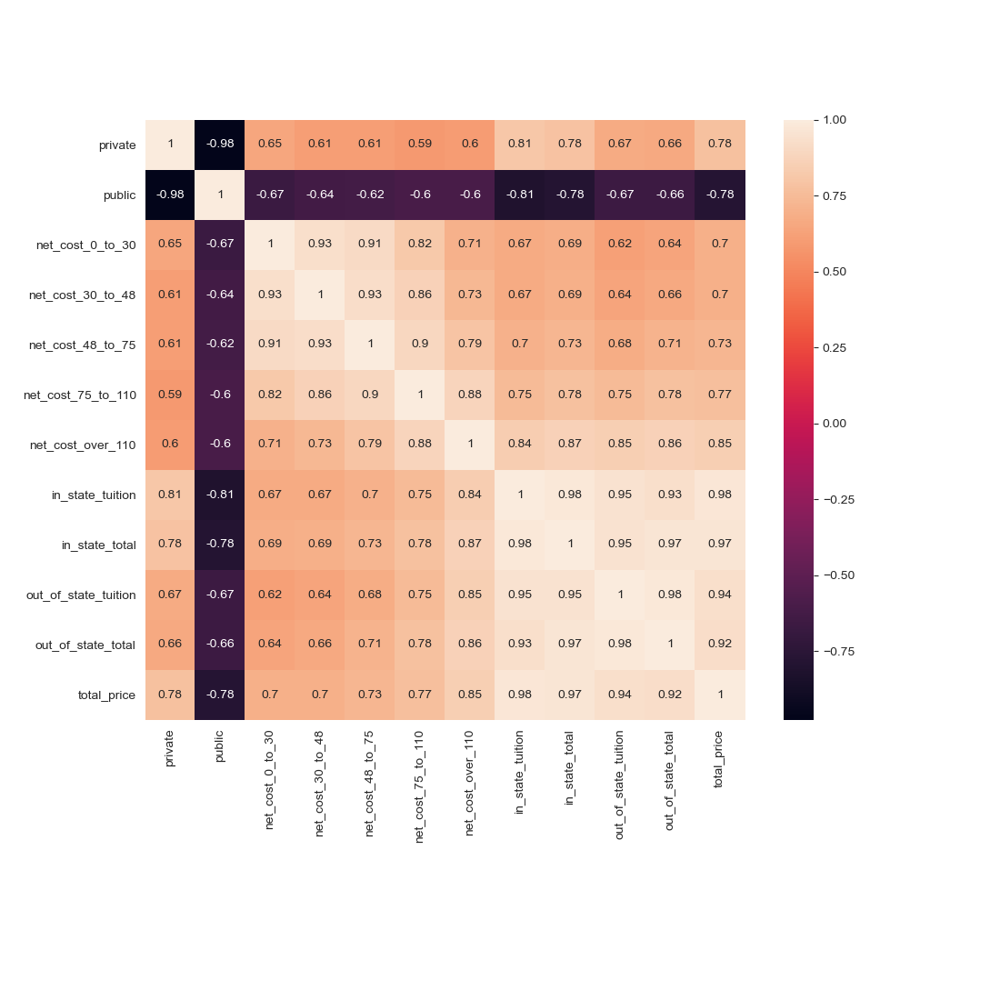

In [48]:
plt.figure(figsize=(11, 11))
sns.heatmap(selected_features_black.corr(), square=True, annot=True)
plt.subplots_adjust(bottom=0.28)
plt.savefig("sf_black_heatmap.png")
plt.show()

In [49]:
selected_features_hispanic = pd.DataFrame()
for i in range(len(inc_div_scaled_features.columns)):
          if selected[2].get_support()[i] == True:
             selected_features_hispanic[inc_div_scaled_features.columns[i]] = inc_div_scaled[inc_div_scaled_features.columns[i]]
selected_features_hispanic

,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,two_year,four_year,room_and_board,in_state_tuition,in_state_total,total_price
0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,1.0,0.0,-1.625550,-1.088963,-1.286139,-0.987779
1,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,1.0,0.0,-1.625550,-1.088963,-1.286139,-0.987779
2,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.0,1.0,0.458436,0.958661,0.887088,0.905391
3,1.0,0.0,1.039239,1.135485,0.958457,0.829002,0.0,1.0,0.458436,0.958661,0.887088,0.764932
4,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.0,1.0,0.458436,0.958661,0.887088,0.905391
...,...,...,...,...,...,...,...,...,...,...,...,...
9130,0.0,1.0,-1.177888,-1.224394,-1.140371,-2.113704,1.0,0.0,-1.625550,-1.150764,-1.335876,-0.777090
9131,0.0,1.0,-1.160509,-1.207496,-1.114995,-2.113704,1.0,0.0,-1.625550,-1.150764,-1.335876,-0.743308
9132,0.0,1.0,-1.032803,-1.020190,-0.887653,-1.054946,1.0,0.0,-1.625550,-0.919326,-1.149614,-1.124969
9133,0.0,1.0,-1.059880,-1.048699,-0.928602,-1.091520,1.0,0.0,-1.625550,-0.919326,-1.149614,-1.155846


<IPython.core.display.Javascript object>


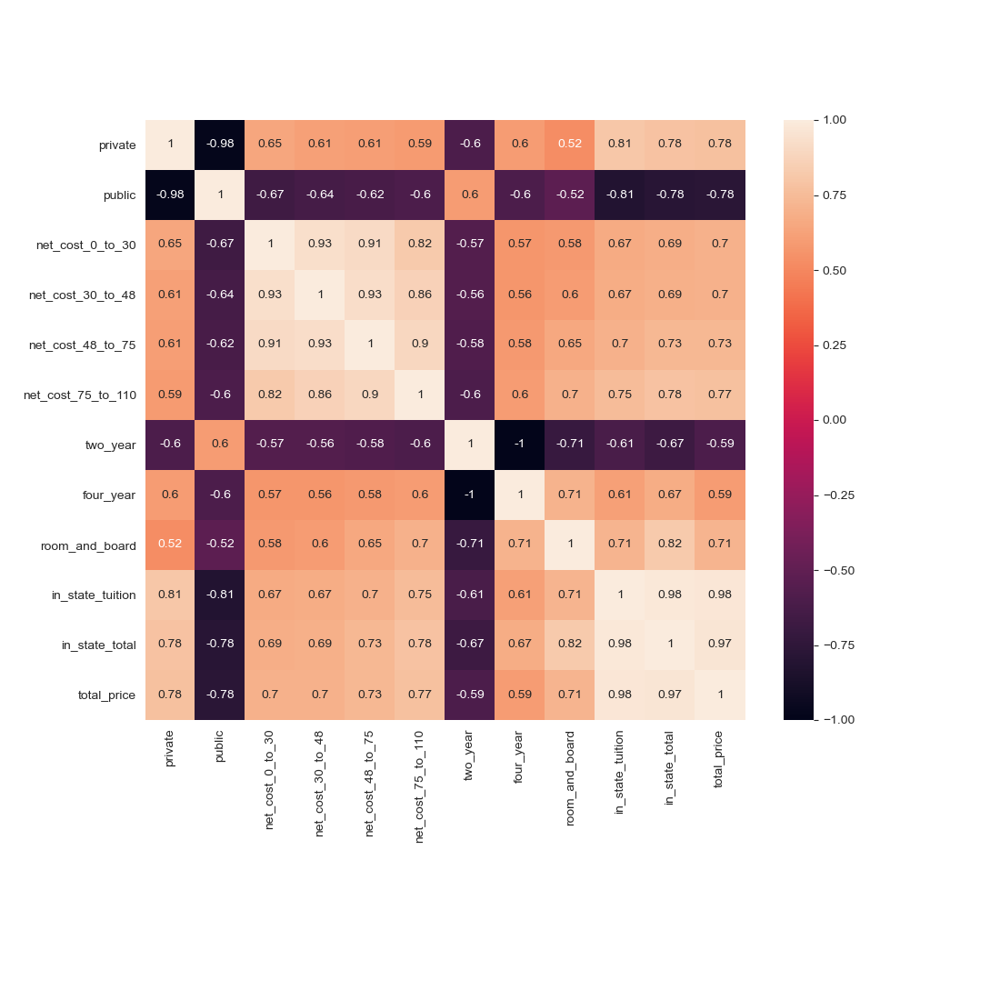

In [50]:
plt.figure(figsize=(11, 11))
sns.heatmap(selected_features_hispanic.corr(), square=True, annot=True)
plt.subplots_adjust(bottom=0.28)
plt.savefig("sf_hispanic_heatmap.png")
plt.show()

In [51]:
selected_features_native = pd.DataFrame()
for i in range(len(inc_div_scaled_features.columns)):
          if selected[3].get_support()[i] == True:
             selected_features_native[inc_div_scaled_features.columns[i]] = inc_div_scaled[inc_div_scaled_features.columns[i]]
selected_features_native

,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,total_price
0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779
1,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,-1.742428,-1.088963,-1.286139,-1.491718,-1.607814,-0.987779
2,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,0.958661,0.887088,0.843117,0.781185,0.905391
3,1.0,0.0,1.039239,1.135485,0.958457,0.829002,0.718642,0.958661,0.887088,0.843117,0.781185,0.764932
4,1.0,0.0,1.183339,1.285896,1.111418,0.977481,0.842820,0.958661,0.887088,0.843117,0.781185,0.905391
...,...,...,...,...,...,...,...,...,...,...,...,...
9130,0.0,1.0,-1.177888,-1.224394,-1.140371,-2.113704,-1.476516,-1.150764,-1.335876,-1.057397,-1.270832,-0.777090
9131,0.0,1.0,-1.160509,-1.207496,-1.114995,-2.113704,-1.469281,-1.150764,-1.335876,-1.057397,-1.270832,-0.743308
9132,0.0,1.0,-1.032803,-1.020190,-0.887653,-1.054946,-0.853078,-0.919326,-1.149614,-0.948817,-1.186587,-1.124969
9133,0.0,1.0,-1.059880,-1.048699,-0.928602,-1.091520,-0.883799,-0.919326,-1.149614,-0.948817,-1.186587,-1.155846


<IPython.core.display.Javascript object>


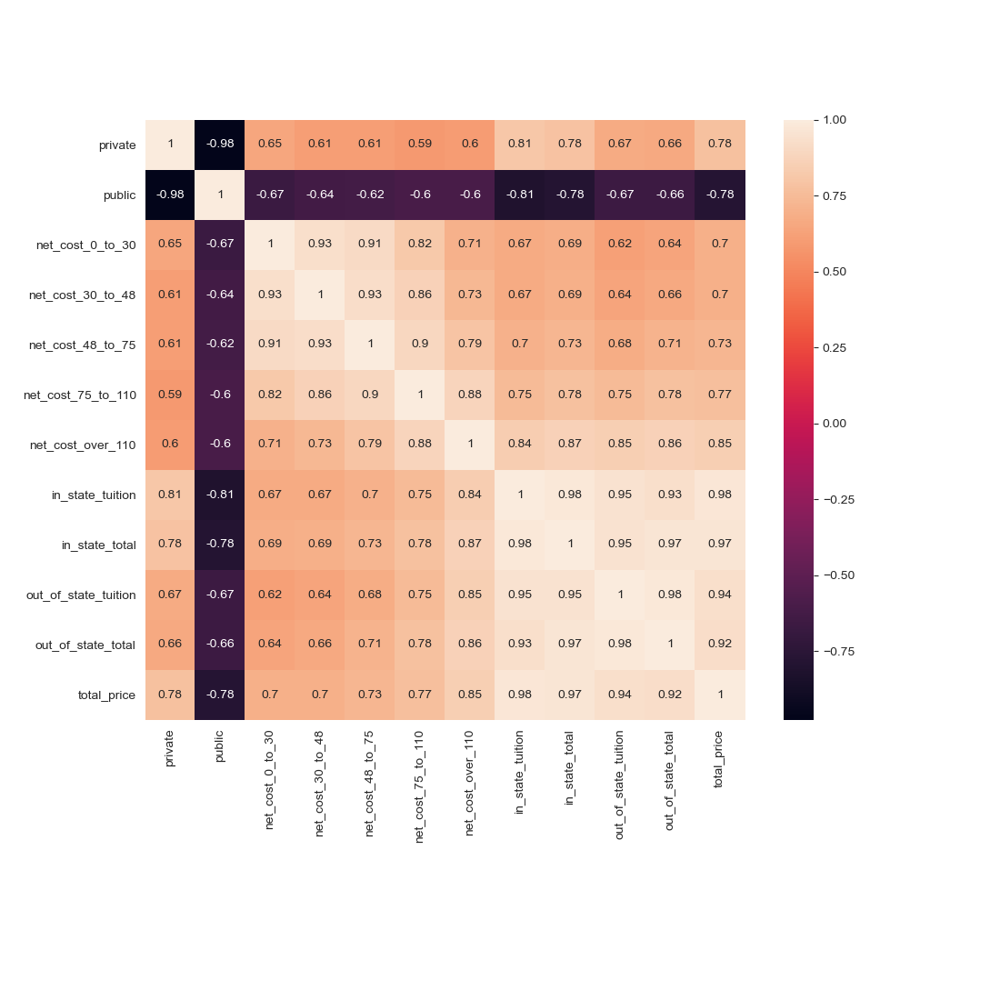

In [52]:
plt.figure(figsize=(11, 11))
sns.heatmap(selected_features_native.corr(), square=True, annot=True)
plt.subplots_adjust(bottom=0.28)
plt.savefig("sf_native_heatmap.png")
plt.show()

In [53]:
selected_features_white = pd.DataFrame()
for i in range(len(inc_div_scaled_features.columns)):
          if selected[4].get_support()[i] == True:
             selected_features_white[inc_div_scaled_features.columns[i]] = inc_div_scaled[inc_div_scaled_features.columns[i]]
selected_features_white

,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,state_code,off_campus,room_and_board,in_state_tuition,in_state_total,total_price
0,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,0,1.0,-1.625550,-1.088963,-1.286139,-0.987779
1,0.0,1.0,-0.711497,-0.916142,-2.073085,-0.967218,0,1.0,-1.625550,-1.088963,-1.286139,-0.987779
2,1.0,0.0,1.183339,1.285896,1.111418,0.977481,1,0.0,0.458436,0.958661,0.887088,0.905391
3,1.0,0.0,1.039239,1.135485,0.958457,0.829002,1,0.0,0.458436,0.958661,0.887088,0.764932
4,1.0,0.0,1.183339,1.285896,1.111418,0.977481,1,1.0,0.458436,0.958661,0.887088,0.905391
...,...,...,...,...,...,...,...,...,...,...,...,...
9130,0.0,1.0,-1.177888,-1.224394,-1.140371,-2.113704,4,1.0,-1.625550,-1.150764,-1.335876,-0.777090
9131,0.0,1.0,-1.160509,-1.207496,-1.114995,-2.113704,4,1.0,-1.625550,-1.150764,-1.335876,-0.743308
9132,0.0,1.0,-1.032803,-1.020190,-0.887653,-1.054946,17,1.0,-1.625550,-0.919326,-1.149614,-1.124969
9133,0.0,1.0,-1.059880,-1.048699,-0.928602,-1.091520,17,1.0,-1.625550,-0.919326,-1.149614,-1.155846


<IPython.core.display.Javascript object>


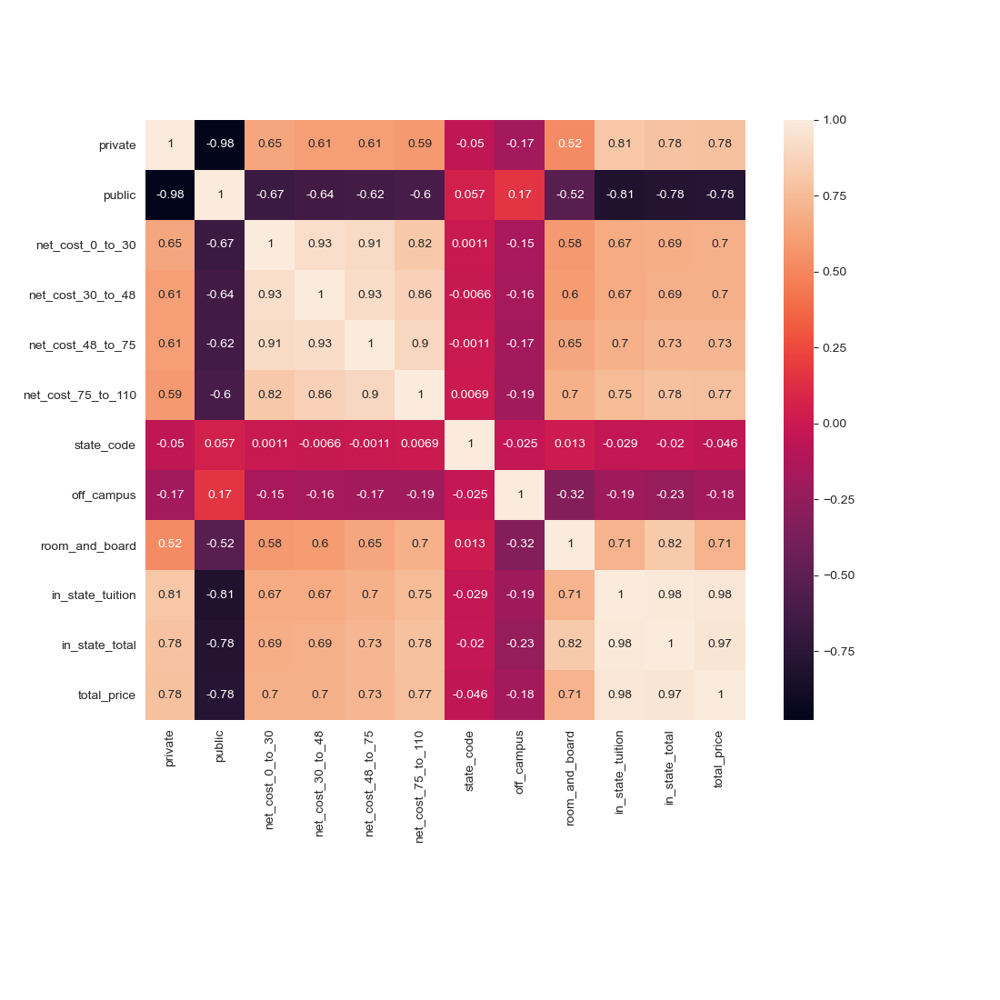

In [54]:
plt.figure(figsize=(11, 11))
sns.heatmap(selected_features_white.corr(), square=True, annot=True)
plt.subplots_adjust(bottom=0.28)
plt.savefig("sf_white_heatmap.png")
plt.show()

In [55]:
#Tuning parameters
param_grid_ridge = {"alpha" : [0.001, 0.01, 0.1, 1, 10, 100], 
              "solver" : ["auto", "svd", "cholesky", "lsqr", "sparse_cg", "sag", "saga"]}
param_grid_lasso = {"alpha" : [0.001, 0.01, 0.1, 1, 10, 100]}
param_grid_kNN = {"metric" : ["euclidean", "manhattan", "minkowski"], "n_neighbors" : [3, 5, 7, 11]}

In [56]:
#GridSearch for Ridge Method
#import GridSearchCV and fit GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV


def hypertune_ridge() :
    best_params = {}
    grid_search = GridSearchCV(Ridge(), param_grid_ridge, cv=5)
    
    for ethnicity, train_test_sets in ethnic_ML_sets.items() :
        print("\tLooking at ", ethnicity, " target group:", sep="")
        print("\t–––––––––––––––––––––––––––––––––––––––")
        X_train, X_test, y_train, y_test = train_test_sets
        
        #feature selection
        select = SelectKBest(score_func = f_regression, k=12)
        select.fit(X_train, y_train)
        #transform sets
        X_train_selected = select.transform(X_train)
        X_test_selected = select.transform(X_test)
        
        grid_search.fit(X=X_train_selected, y=y_train)
        
        print("\t\tBest parameters: ", grid_search.best_params_)
        print("\t\tBest cross-validation score: ", grid_search.best_score_)
        print("\t\tTest set score: ", grid_search.score(X_test_selected, y_test))
        best_params[ethnicity] = (grid_search.best_params_, X_train_selected, X_test_selected, y_train, y_test)
    return best_params

In [57]:
#GridSearch for Lasso Method
#import GridSearchCV and fit GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

def hypertune_lasso() :
    best_params = {}
    grid_search = GridSearchCV(Lasso(tol=0.1), param_grid_lasso, cv=5)
    
    for ethnicity, train_test_sets in ethnic_ML_sets.items() :
        print("\tLooking at ", ethnicity, " target group:", sep="")
        print("\t–––––––––––––––––––––––––––––––––––––––")
        X_train, X_test, y_train, y_test = train_test_sets
        
        #feature selection
        select = SelectKBest(score_func = f_regression, k=12)
        select.fit(X_train, y_train)
        #transform sets
        X_train_selected = select.transform(X_train)
        X_test_selected = select.transform(X_test)
        
        grid_search.fit(X=X_train_selected, y=y_train)
        
        print("\t\tBest parameters: ", grid_search.best_params_)
        print("\t\tBest cross-validation score: ", grid_search.best_score_)
        print("\t\tTest set score: ", grid_search.score(X_test_selected, y_test))
        best_params[ethnicity] = (grid_search.best_params_, X_train_selected, X_test_selected, y_train, y_test)
    return best_params

In [58]:
#GridSearch for kNN Method
#import GridSearchCV and fit GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV

def hypertune_kNN() :
    best_params = {}
    grid_search = GridSearchCV(KNeighborsRegressor(), param_grid_kNN, cv=5)
    
    for ethnicity, train_test_sets in ethnic_ML_sets.items() :
        print("\tLooking at ", ethnicity, " target group:", sep="")
        print("\t–––––––––––––––––––––––––––––––––––––––")
        X_train, X_test, y_train, y_test = train_test_sets
        
        #feature selection
        select = SelectKBest(score_func = f_regression, k=12)
        select.fit(X_train, y_train)
        #transform sets
        X_train_selected = select.transform(X_train)
        X_test_selected = select.transform(X_test)
        
        grid_search.fit(X=X_train_selected, y=y_train)
        
        print("\t\tBest parameters: ", grid_search.best_params_)
        print("\t\tBest cross-validation score: ", grid_search.best_score_)
        print("\t\tTest set score: ", grid_search.score(X_test_selected, y_test))
        best_params[ethnicity] = (grid_search.best_params_, X_train_selected, X_test_selected, y_train, y_test)
    return best_params

In [59]:
print("MACHINE LEARNING MODELS AFTER HYPERPARAMETER TUNING\n")

print("Ridge Regression with Tuning:\n")
best_ridge = hypertune_ridge()
print("\n", end="")
print("=========================================")
print("Lasso Regression with Tuning:\n")
best_lasso = hypertune_lasso()
print("\n", end="")
print("=========================================")
print("kNN Regression with Tuning:\n")
best_knn = hypertune_kNN()
print("\n", end="")

MACHINE LEARNING MODELS AFTER HYPERPARAMETER TUNING

Ridge Regression with Tuning:

	Looking at Asian target group:
	–––––––––––––––––––––––––––––––––––––––
		Best parameters:  {'alpha': 10, 'solver': 'sparse_cg'}
		Best cross-validation score:  0.10428362426761148
		Test set score:  0.10028917903484835
	Looking at Black target group:
	–––––––––––––––––––––––––––––––––––––––
		Best parameters:  {'alpha': 10, 'solver': 'svd'}
		Best cross-validation score:  0.11995463765740351
		Test set score:  0.1286417164927044
	Looking at Hispanic target group:
	–––––––––––––––––––––––––––––––––––––––
		Best parameters:  {'alpha': 10, 'solver': 'lsqr'}
		Best cross-validation score:  0.10112728114170047
		Test set score:  0.1073988538349483
	Looking at Native American/Alaskan target group:
	–––––––––––––––––––––––––––––––––––––––
		Best parameters:  {'alpha': 100, 'solver': 'lsqr'}
		Best cross-validation score:  0.05318753378443686
		Test set score:  0.05806782662475474
	Looking at White target gro

In [60]:
i = 0

for group in ("Asian", "Black", "Hispanic", "Native American/Alaskan", "White"):
    print(group)
    print("----------------------------\n")
    best_metric = best_knn[group][0]['metric']
    best_n = best_knn[group][0]['n_neighbors']
    model = KNeighborsRegressor().set_params(metric=best_metric, n_neighbors=best_n).fit(X=best_knn[group][1], y=best_knn[group][3])
    print("KNeighborsRegressor (with tuned metric of:", str(best_metric), "and tuned n-neighbors of:", str(best_n) + ")")
    print("\tR-squared value for training set: ", r2_score(best_knn[group][3], model.predict(best_knn[group][1])))
    print("\tR-squared value for testing set: ", r2_score(best_knn[group][4], model.predict(best_knn[group][2])))
    print("\n")
    i += 1

Asian
----------------------------

KNeighborsRegressor (with tuned metric of: manhattan and tuned n-neighbors of: 3)
	R-squared value for training set:  0.9104923429361559
	R-squared value for testing set:  0.77552731925567


Black
----------------------------

KNeighborsRegressor (with tuned metric of: euclidean and tuned n-neighbors of: 3)
	R-squared value for training set:  0.8955093546819827
	R-squared value for testing set:  0.6238310798989632


Hispanic
----------------------------

KNeighborsRegressor (with tuned metric of: manhattan and tuned n-neighbors of: 3)
	R-squared value for training set:  0.8739984911748588
	R-squared value for testing set:  0.6278581018000837


Native American/Alaskan
----------------------------

KNeighborsRegressor (with tuned metric of: manhattan and tuned n-neighbors of: 3)
	R-squared value for training set:  0.9006760733817927
	R-squared value for testing set:  0.7766851654814295


White
----------------------------

KNeighborsRegressor (with tun